# 2022.03.23.

In [338]:
import sys

full_path_to_modul_dir = 'D:/mcbj_stmbj'  # here enter the full path to the directory that contains the modul on your computer
sys.path.append(full_path_to_modul_dir)

import re
import os
import warnings
warnings.filterwarnings("error")

In [2]:
from mcbj import *
import filter_traces
import plots
import seaborn as sns

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

date = "22_03_23"
sample_rate = 50_000
home_folder = Path(f"D:/BJ_Data/{date}")
# home_folder = Path(f"//DATACENTER/BreakJunction_group/BJ_Data/{date}")

In [3]:
trace_pair =TracePair(25201, load_from=home_folder)

r_serial = trace_pair.R_serial
print(r_serial)

99900.0


In [386]:
hold_off_traces = [np.arange(1, 20200, 1),
                   np.arange(20201, 21200, 1),
                   np.arange(21201, 25200, 1)]

In [387]:
hold_off_hists = []

for traces in hold_off_traces:
    hold_off_hists.append(Histogram(folder=home_folder,
                                    traces=traces,
                                    conductance_range=(1e-5, 10),
                                    conductance_bins_num=20,
                                    conductance_bins_mode='decade'))
    hold_off_hists[-1].calc_stats(align_at=0.1,
                                  range_pull=(-0.05, 0.2),
                                  range_push=(-0.5, 1.2))

  0%|          | 0/20199 [00:00<?, ?it/s]

Pull 2D histogram created from 20199 traces
Push 2D histogram created from 20199 traces


  0%|          | 0/999 [00:00<?, ?it/s]

Pull 2D histogram created from 999 traces
Push 2D histogram created from 999 traces


  0%|          | 0/3999 [00:00<?, ?it/s]

Pull 2D histogram created from 3999 traces
Push 2D histogram created from 3999 traces


3


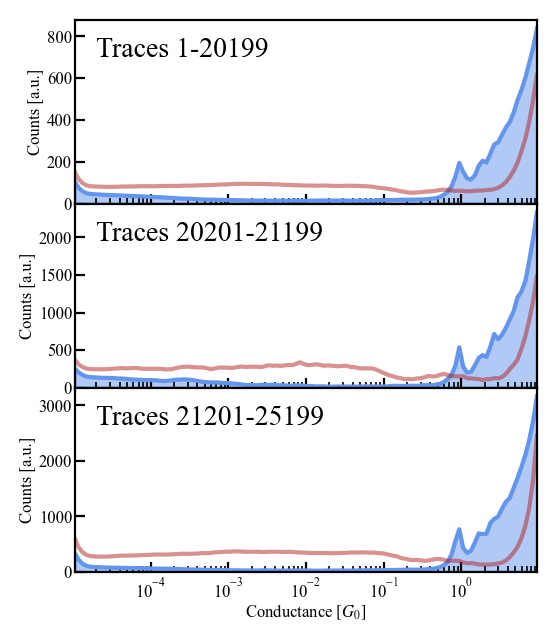

In [388]:
print(len(hold_off_hists))
figsize=(3, 1*len(hold_off_hists))
dpi=200
fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(len(hold_off_hists), 1, figure=fig,
                  left=0.19, right=0.96, top=0.98, bottom=0.06,
                  hspace=0, wspace=0.2)

ax_hists = []
for i, hist in enumerate(hold_off_hists):
    ax_hists.append(fig.add_subplot(gs[i]))
    
    hist.plot_hist_1d(ax=ax_hists[i], dpi=dpi)
    ax_hists[i].text(x=2e-5, y=0.8*ax_hists[i].get_ylim()[1], s=f'Traces {hold_off_traces[i][0]}-{hold_off_traces[i][-1]}', fontsize=10)
    ax_hists[i].set_ylabel('Counts [a.u.]')
    
plt.savefig(home_folder.joinpath('results/histograms_1D_hold_off.png'))

# I(V) measurements

## Details

**bias waveform**: *custom_IV_mcbj_with_wait.ini*

**IV bias range**: $\pm 1\;\text{V}$

added 500 ms long 100 mV wait in the beginning to account for relaxation

In [335]:
iv_traces_1 = np.arange(25201, 25500+1, 1)
iv_traces_2 = np.arange(25501, 27000+1, 1)
iv_traces_3 = np.arange(27001, 28500+1, 1)
iv_traces_4 = np.arange(28501, 29501+1, 1)
iv_traces_5 = np.arange(29502, 32600+1, 1)
iv_traces_6 = np.arange(32601, 33700+1, 1)
iv_traces_7 = np.arange(33701, 34200+1, 1)

iv_traces_total = np.concatenate((iv_traces_1, iv_traces_2,
                                  iv_traces_3, iv_traces_4,
                                  iv_traces_5, iv_traces_6,
                                  iv_traces_7))

In [392]:
hold_on_traces = [iv_traces_1, iv_traces_2, iv_traces_3, iv_traces_4, iv_traces_5, iv_traces_6, iv_traces_7]

In [390]:
hold_on_hists = []

for traces in hold_on_traces:
    hold_on_hists.append(Histogram(folder=home_folder,
                                    traces=traces,
                                    conductance_range=(1e-5, 10),
                                    conductance_bins_num=20,
                                    conductance_bins_mode='decade'))
    hold_on_hists[-1].calc_stats(align_at=0.1,
                                  range_pull=(-0.05, 0.2),
                                  range_push=(-0.5, 1.2))

  0%|          | 0/300 [00:00<?, ?it/s]

Pull 2D histogram created from 300 traces
Push 2D histogram created from 300 traces


  0%|          | 0/1500 [00:00<?, ?it/s]

Pull 2D histogram created from 1500 traces
Push 2D histogram created from 1500 traces


  0%|          | 0/1500 [00:00<?, ?it/s]

Pull 2D histogram created from 1500 traces
Push 2D histogram created from 1500 traces


  0%|          | 0/1001 [00:00<?, ?it/s]

Pull 2D histogram created from 1001 traces
Push 2D histogram created from 1001 traces


  0%|          | 0/3099 [00:00<?, ?it/s]

Pull 2D histogram created from 3099 traces
Push 2D histogram created from 3099 traces


  0%|          | 0/1100 [00:00<?, ?it/s]

Pull 2D histogram created from 1100 traces
Push 2D histogram created from 1100 traces


  0%|          | 0/500 [00:00<?, ?it/s]

Pull 2D histogram created from 500 traces
Push 2D histogram created from 500 traces


7


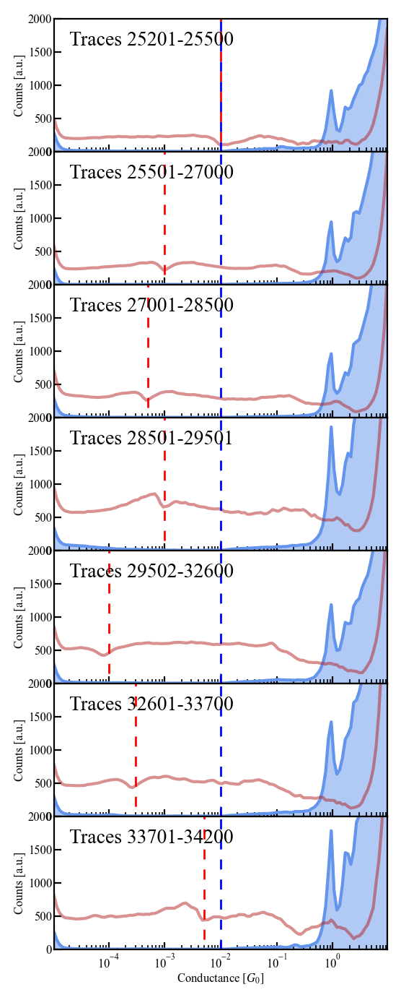

In [396]:
print(len(hold_on_hists))
figsize=(3, 1*len(hold_on_hists))
dpi=200
fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(len(hold_on_hists), 1, figure=fig,
                  left=0.19, right=0.96, top=0.98, bottom=0.06,
                  hspace=0, wspace=0.2)

ax_hists = []
for i, hist in enumerate(hold_on_hists):
    ax_hists.append(fig.add_subplot(gs[i]))
    
    trace_pair = TracePair(hist.traces[-1], load_from=home_folder)
    
    hist.plot_hist_1d(ax=ax_hists[i], dpi=dpi)
    ax_hists[i].set_ylim(0, 2000)
    ax_hists[i].text(x=2e-5, y=0.8*ax_hists[i].get_ylim()[1], s=f'Traces {hold_on_traces[i][0]}-{hold_on_traces[i][-1]}', fontsize=10)
    ax_hists[i].set_ylabel('Counts [a.u.]')
    ax_hists[i].axvline(trace_pair.hold_set_pull, c='b', ls=(0, (5, 5)), lw=1)
    ax_hists[i].axvline(trace_pair.hold_set_push, c='r', ls=(5, (5, 5)), lw=1)
    
plt.savefig(home_folder.joinpath('results/histograms_1D_hold_on.png'))

In [336]:
total_num = iv_traces_total.shape[0]

In [339]:
pull_set_trigger = np.zeros_like(iv_traces_total)*np.nan
pull_last_before_hold = np.zeros_like(iv_traces_total)*np.nan
pull_first_after_hold = np.zeros_like(iv_traces_total)*np.nan
pull_start_avg = np.zeros_like(iv_traces_total)*np.nan
pull_end_avg = np.zeros_like(iv_traces_total)*np.nan
iv_diff_pull = np.zeros_like(iv_traces_total)*np.nan

push_set_trigger = np.zeros_like(iv_traces_total)*np.nan
push_last_before_hold = np.zeros_like(iv_traces_total)*np.nan
push_first_after_hold = np.zeros_like(iv_traces_total)*np.nan
push_start_avg = np.zeros_like(iv_traces_total)*np.nan
push_end_avg = np.zeros_like(iv_traces_total)*np.nan
iv_diff_push = np.zeros_like(iv_traces_total)*np.nan

for i, trace in enumerate(tqdm(iv_traces_total)):
    trace_pair = TracePair(trace, load_from=home_folder)
    
    try:
        hold_trace= HoldTrace(trace,
                              load_from=home_folder, bias_offset=0,
                              r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

        pull_set_trigger[i] = trace_pair.hold_set_pull
        pull_last_before_hold[i] = trace_pair.conductance_pull[trace_pair.hold_index_pull]
        pull_first_after_hold[i] = trace_pair.conductance_pull[trace_pair.hold_index_pull + 1]
        pull_start_avg[i] = hold_trace.G_hold_pull
        pull_end_avg[i] = hold_trace.G_avg_pull
        iv_diff_pull[i] = filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100)
    
    except MeasurementNotComplete:
        ...
    except MeasurementOverflow:
        ...
    
    try:
        hold_trace= HoldTrace(trace,
                              load_from=home_folder, bias_offset=0,
                              r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)
        
        push_set_trigger[i] = trace_pair.hold_set_push
        push_last_before_hold[i] = trace_pair.conductance_push[trace_pair.hold_index_push]
        push_first_after_hold[i] = trace_pair.conductance_push[trace_pair.hold_index_push + 1]
        push_start_avg[i] = hold_trace.G_hold_push
        push_end_avg[i] = hold_trace.G_avg_push
        iv_diff_push[i] = filter_traces.iv_difference(hold_trace, direction='push', smoothing=100)
    
    except MeasurementNotComplete:
        ...
    except MeasurementOverflow:
        ...

  0%|          | 0/9000 [00:00<?, ?it/s]

In [385]:
trace_pair.hold_index_push

trace_pair.conductance_push[trace_pair.hold_index_push: trace_pair.hold_index_push+100]

array([0.00502123, 0.00183186, 0.00178585, 0.00172451, 0.00169577,
       0.00166618, 0.00164046, 0.00160058, 0.00154753, 0.00158942,
       0.00164705, 0.00169296, 0.00176588, 0.00179473, 0.0017238 ,
       0.00181501, 0.00183897, 0.00183055, 0.00185064, 0.00184882,
       0.00172663, 0.00168312, 0.00156043, 0.00149263, 0.00145432,
       0.00153146, 0.00157686, 0.00163776, 0.00157464, 0.00161978,
       0.0016663 , 0.00174695, 0.00173818, 0.00180393, 0.00182696,
       0.00183677, 0.00164584, 0.00166126, 0.00160454, 0.00160964,
       0.00160149, 0.00156272, 0.00155834, 0.00160119, 0.00157888,
       0.00163973, 0.00166572, 0.00180899, 0.00187001, 0.00190329,
       0.0019689 , 0.0018515 , 0.00178585, 0.00168342, 0.00164008,
       0.00159532, 0.00158768, 0.00157991, 0.00156592, 0.00153171,
       0.0016307 , 0.00159766, 0.00170615, 0.00174209, 0.00183736,
       0.00188102, 0.00181957, 0.00176623, 0.00183482, 0.0018346 ,
       0.00175407, 0.00172368, 0.00174209, 0.00174616, 0.00164

In [341]:
hold_df_pull = pd.DataFrame(data={'pull_set_trigger': pull_set_trigger,
                                  'pull_last_before_hold': pull_last_before_hold,
                                  'pull_first_after_hold': pull_first_after_hold,
                                  'pull_start_avg': pull_start_avg,
                                  'pull_end_avg': pull_end_avg,
                                  'iv_diff_pull': iv_diff_pull}, index = iv_traces_total)

hold_df_push = pd.DataFrame(data={'push_set_trigger': push_set_trigger,
                                  'push_last_before_hold': push_last_before_hold,
                                  'push_first_after_hold': push_first_after_hold,
                                  'push_start_avg': push_start_avg,
                                  'push_end_avg': push_end_avg,
                                  'iv_diff_push': iv_diff_push}, index=iv_traces_total)

In [342]:
hold_df_pull.describe()

,pull_set_trigger,pull_last_before_hold,pull_first_after_hold,pull_start_avg,pull_end_avg,iv_diff_pull
count,8636.00,8.636000e+03,8.636000e+03,8636.000000,8636.000000,8636.000000
mean,0.01,7.290006e-03,1.417078e-05,0.005019,0.000014,0.800735
std,0.00,8.571884e-03,1.652429e-04,0.023421,0.000175,0.298922
min,0.01,6.213177e-07,6.024921e-09,0.000001,0.000001,0.317829
25%,0.01,2.097793e-03,1.088502e-06,0.000060,0.000002,0.641669
50%,0.01,5.645288e-03,2.380119e-06,0.000306,0.000003,0.820449
75%,0.01,9.319057e-03,4.582077e-06,0.003293,0.000004,0.913511
max,0.01,9.391215e-02,9.461739e-03,0.845833,0.009401,14.396452


In [343]:
hold_df_push.describe()

,push_set_trigger,push_last_before_hold,push_first_after_hold,push_start_avg,push_end_avg,iv_diff_push
count,8636.000000,8636.000000,8.636000e+03,8636.000000,8636.000000,8636.000000
mean,0.000755,0.000783,6.513939e-04,0.000599,0.000660,0.817236
std,0.001273,0.001366,1.712120e-03,0.001074,0.001746,0.523374
min,0.000100,0.000035,6.752884e-08,0.000004,0.000002,0.287830
25%,0.000100,0.000105,8.076523e-05,0.000073,0.000082,0.567006
50%,0.000500,0.000482,2.749408e-04,0.000324,0.000275,0.699798
75%,0.001000,0.001003,6.998833e-04,0.000766,0.000703,0.894903
max,0.010000,0.018788,6.685740e-02,0.015157,0.068494,12.610004


In [344]:
hold_df_pull.isnull().sum()

pull_set_trigger         364
pull_last_before_hold    364
pull_first_after_hold    364
pull_start_avg           364
pull_end_avg             364
iv_diff_pull             364
dtype: int64

In [345]:
hold_df_push.isnull().sum()

push_set_trigger         364
push_last_before_hold    364
push_first_after_hold    364
push_start_avg           364
push_end_avg             364
iv_diff_push             364
dtype: int64

In [346]:
hold_df_pull = hold_df_pull.dropna()
hold_df_push = hold_df_push.dropna()

hold_df_pull.isnull().sum()
hold_df_push.isnull().sum()

push_set_trigger         0
push_last_before_hold    0
push_first_after_hold    0
push_start_avg           0
push_end_avg             0
iv_diff_push             0
dtype: int64

In [347]:
did_not_break_pull, _ = filter_traces.filter_hold(home_folder,
                                                  filter_condition=filter_traces.does_not_break_array,
                                                  traces= hold_df_pull.index.to_numpy(),
                                                  bias_offset=0, r_serial_ohm=r_serial,
                                                  min_step_len=20_000)

  0%|          | 0/8636 [00:00<?, ?it/s]

In [348]:
_, did_not_break_push = filter_traces.filter_hold(home_folder,
                                                  filter_condition=filter_traces.does_not_break_array,
                                                  traces= hold_df_push.index.to_numpy(),
                                                  bias_offset=0, r_serial_ohm=r_serial,
                                                  min_step_len=20_000)

  0%|          | 0/8636 [00:00<?, ?it/s]

In [349]:
hold_df_pull['pull_did_not_break'] = hold_df_pull.index.isin(did_not_break_pull)
hold_df_push['push_did_not_break'] = hold_df_pull.index.isin(did_not_break_push)

In [350]:
# hold_df['push_did_not_break'].sum()

In [351]:
print(f'pull: {len(did_not_break_pull)}, {len(did_not_break_pull)/total_num*100}%')
print(f'push: {len(did_not_break_push)}, {len(did_not_break_push)/total_num*100}%')

pull: 348, 3.8666666666666667%
push: 8220, 91.33333333333333%


In [352]:
stable_pull, _ = filter_traces.filter_hold(home_folder, filter_condition=filter_traces.conductances_close,
                                           traces=did_not_break_pull,
                                           bias_offset=0, r_serial_ohm=r_serial,
                                           min_step_len=20_000, max_ratio=2, plateaus=(1, 3))

_, stable_push = filter_traces.filter_hold(home_folder, filter_condition=filter_traces.conductances_close,
                                           traces=did_not_break_push,
                                           bias_offset=0, r_serial_ohm=r_serial,
                                           min_step_len=20_000, max_ratio=2, plateaus=(1, 3))

  0%|          | 0/348 [00:00<?, ?it/s]

  0%|          | 0/8220 [00:00<?, ?it/s]

In [353]:
hold_df_pull['pull_stable'] = hold_df_pull.index.isin(stable_pull)
hold_df_push['push_stable'] = hold_df_push.index.isin(stable_push)

In [354]:
print(f'pull: {len(stable_pull)}, {len(stable_pull)/total_num*100}%')
print(f'push: {len(stable_push)}, {len(stable_push)/total_num*100}%')

pull: 265, 2.944444444444444%
push: 8027, 89.18888888888888%


In [356]:
iv_good_pull = hold_df_pull[np.bitwise_and(hold_df_pull['pull_stable'], hold_df_pull['iv_diff_pull'] < 0.5)].index.to_numpy().astype(np.int32)
iv_good_push = hold_df_push[np.bitwise_and(hold_df_push['push_stable'], hold_df_push['iv_diff_push'] < 0.5)].index.to_numpy().astype(np.int32)

In [397]:
print(f'pull: {len(iv_good_pull)}, {len(iv_good_pull)/total_num*100}%')
print(f'push: {len(iv_good_push)}, {len(iv_good_push)/total_num*100}%')

pull: 40, 0.4444444444444444%
push: 1124, 12.488888888888889%


In [358]:
hold_df_pull.head()

,pull_set_trigger,pull_last_before_hold,pull_first_after_hold,pull_start_avg,pull_end_avg,iv_diff_pull,pull_did_not_break,pull_stable
25201,0.01,0.003181,1.617447e-06,0.000194,0.000002,0.951639,False,False
25205,0.01,0.001298,2.276903e-07,0.000335,0.000002,0.897374,False,False
25208,0.01,0.009293,3.129473e-05,0.001095,0.000038,0.612683,True,True
25221,0.01,0.001971,1.415846e-07,0.000491,0.000004,1.910872,False,False
25223,0.01,0.011298,7.440758e-07,0.000039,0.000002,0.943270,False,False


In [359]:
hold_df_push.head()

,push_set_trigger,push_last_before_hold,push_first_after_hold,push_start_avg,push_end_avg,iv_diff_push,push_did_not_break,push_stable
25201,0.01,0.008242,0.002796,0.005138,0.002767,0.596353,True,True
25205,0.01,0.010047,0.011117,0.008411,0.010986,0.908488,True,True
25208,0.01,0.010266,0.005878,0.009776,0.005606,0.537449,True,True
25221,0.01,0.008253,0.011420,0.004572,0.011074,1.927289,True,True
25223,0.01,0.013666,0.006974,0.009544,0.007951,1.045155,True,True


In [360]:
# noise_pull = NoiseStats(folder=home_folder, bias_offset=0, traces=iv_good_pull,
#                         num_of_fft=5, subtract_bg=False,
#                         min_step_len=20_000, min_height=1, iv=1,
#                         save_data=1)

In [361]:
# noise_pull.__dict__

In [362]:
# noise_push = NoiseStats(folder=home_folder, bias_offset=0, traces=iv_good_push,
#                         num_of_fft=5, subtract_bg=False,
#                         min_step_len=20_000, min_height=1, iv=1,
#                         save_data=2)

In [363]:
# for trace in tqdm(iv_good_pull):
#     hold_trace = HoldTrace(trace,
#                            load_from=home_folder, bias_offset=0,
#                            r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)
#     hold_trace.save_iv_for_laci(home_folder=home_folder, direction='pull')
    
# for trace in tqdm(iv_good_push):
#     hold_trace = HoldTrace(trace,
#                            load_from=home_folder, bias_offset=0,
#                            r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)
#     hold_trace.save_iv_for_laci(home_folder=home_folder, direction='push')

# Zoli's analysis

In [4]:
home_folder.joinpath('results/IVs/Tunnel_22_03_23_push_fits_all.csv')

WindowsPath('D:/BJ_Data/22_03_23/results/IVs/Tunnel_22_03_23_push_fits_all.csv')

In [5]:
os.listdir(home_folder.joinpath('results/IVs'))

['22_03_23_selected_iv_diff.zip',
 'selected',
 'Tunnel_22_03_23_push_fits_all.xlsx']

In [39]:
def calc_noise_sim(sim_data_df, dgap=0.0, dphi=0.0):
    """
    Calculates noise from simulation data.
    You can select which parameter you want to be fluctuating and set the other to zero.
    If both values are nonzero, both parameters fluctuate.
    
    Parameters
    ----------
    sim_data_df: `pd.DataFrame` containing data from Laci's simulation software. (best fit parameters)
    dgap: float, gap fluctuation in nm, default: 0.0
    dphi: float, barrier fluctuation in eV, default: 0.0
        
    Returns
    -------
    calculated relative noise (dG/G) with the given fluctuating variables (dgap, dphi).
    """
    
    # 1e-9
    # 1.6e-19
    
    # if dgap is None and dphi is None:
    #     raise ValueError(f'You entered dgap={dgap} and dphi={dphi}. One of them has to be not `None`')
    # elif dgap is None:
    #     print("Calculating relative noise when the barrier fluctuates.")
    #     sim_fluct_relnoise_push = sim_data_df['dR/dPhi'] * dphi * 1.6e-19 / sim_data_df['R [Ohm]']
    # elif dphi is None:
    #     print("Calculating relative noise when the gap fluctuates.")
    #     sim_fluct_relnoise_push = sim_data_df['dR/dz'] * dgap * 1e-9 / sim_data_df['R [Ohm]']
    # else:
    #     print("Calculating relative noise when both the barrier and the gap fluctuates.")
    #     sim_fluct_relnoise_push = np.sqrt((sim_data_df['dR/dz'] * dgap * 1e-9)**2 + (sim_data_df['dR/dPhi'] * dphi * 1.6e-19)**2) / sim_data_df['R [Ohm]']
    #    
    # return sim_fluct_relnoise_push
    
    print(f"Calculating relative noise when the barrier fluctuation is dphi={dphi} eV and the gap fluctuation is dgap={dgap} nm.")
    
    # multiply by 1e-9 so the unit is nanometer
    # multiply by 1.6e-19 (unit charge) so the unit is eV
    
    return np.sqrt((sim_data_df['dR/dz'] * dgap * 1e-9)**2 + (sim_data_df['dR/dPhi'] * dphi * 1.6e-19)**2) / sim_data_df['R [Ohm]']

**Columns:**
* `Trace`: tracenumber of analyzed trace
* `Fit Trace`: long name containing info abput analyzed trace, IV portion and direction
* `R [Ohm]`: simulated resistance
* `z -Gap [nm]`: simulated gap size in nm
* `Phi - Barrier [eV]`: simulated barrier value in eV
* `dR/dz`: from simulation
* `dR/dPhi`: from simulation
* `G_meas2 [G0]`: avg conductance of plateau 2 
* `dG/G_meas2`: relative noise of plateau 2
* `G_meas4 [G0]`: avg conductance of plateau 4
* `dG/G_meas4`: relative noise of plateau 4

**Calculation of relative noise from the simulated data, with the barrier and gap fluctuations $\Delta \phi$, $\Delta z$, respectively:**

$$ \frac{dG}{G} = \frac{1}{R} \cdot \sqrt{ \left( \left( \frac{dR}{dz} \cdot \Delta z \cdot 1 \cdot 10^{-9} \right)^2 + \left( \frac{dR}{d\phi} \cdot \Delta \phi \cdot 1.6\cdot 10^{-19} \right)^2 \right)}$$

**Calculated/Transformed**
* `Part`: IV portion extracted from `Fit Trace`
* `G [G0]`: conductance calculated from the simulated resistance
* `dG/G_sim_phi`: $\Delta \phi = 33 \cdot 10^{-3}\;\mathrm{eV}$
* `dG/G_sim_gap`: $\Delta z = 3 \cdot 10^{-3}\;\mathrm{nm}$
* `dG/G_sim_gap_phi`: $\Delta \phi = 33 \cdot 10^{-3}\;\mathrm{eV}$, $\Delta z = 3 \cdot 10^{-3}\;\mathrm{nm}$

In [94]:
my_cmap = ListedColormap(np.vstack((np.array([1., 1., 1., 0.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))


my_cmap_blues = ListedColormap(np.vstack((np.array([1., 1., 1., 0.]).reshape(1, -1),
                                          colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))
my_cmap_reds = ListedColormap(np.vstack((np.array([1., 1., 1., 0.]).reshape(1, -1),
                                         colormaps['plasma'](np.linspace(0.0, 1.0, 31)))))

In [6]:
sim_data = pd.read_excel(home_folder.joinpath('results/IVs/Tunnel_22_03_23_push_fits_all.xlsx'))

In [7]:
sim_data['Part'] = sim_data['Fit Trace'].map(lambda x: int(re.search(r'(\d)\_IV\w*', x).group(1)))

In [18]:
sim_data['G [G0]'] = sim_data['R [Ohm]'].map(utils.convert_ohm_to_g0)

In [42]:
# REORDER COLUMNS
sim_data = sim_data[['Trace', 'Part', 'G [G0]', 'R [Ohm]', 'z -Gap [nm]', 'Phi - Barrier [eV]', 'dR/dz', 'dR/dPhi', 'G_meas2 [G0]', 'dG/G_meas2', 'G_meas4 [G0]', 'dG/G_meas4', 'Fit Trace']]

In [92]:
sim_data['dG/G_sim_gap'] = calc_noise_sim(sim_data, dgap=3e-3, dphi=0)
sim_data['dG/G_sim_phi'] = calc_noise_sim(sim_data, dgap=0, dphi=33e-3)
sim_data['dG/G_sim_gap_phi'] = calc_noise_sim(sim_data, dgap=1.5e-3, dphi=33e-3)

Calculating relative noise when the barrier fluctuation is dphi=0 eV and the gap fluctuation is dgap=0.003 nm.
Calculating relative noise when the barrier fluctuation is dphi=0.033 eV and the gap fluctuation is dgap=0 nm.
Calculating relative noise when the barrier fluctuation is dphi=0.033 eV and the gap fluctuation is dgap=0.0015 nm.


In [93]:
sim_data.sort_values(by=['Trace', 'Part'])

,Trace,Part,G [G0],R [Ohm],z -Gap [nm],Phi - Barrier [eV],dR/dz,dR/dPhi,G_meas2 [G0],dG/G_meas2,G_meas4 [G0],dG/G_meas4,Fit Trace,dG/G_sim_gap,dG/G_sim_phi,dG/G_sim_gap_phi
0,25239,1,0.003952,3.263771e+06,0.19,1.14,4.848058e+16,1.225654e+25,0.003038,0.032679,0.003845,0.045625,'1_IV_trace_25239_push_pl',0.044562,0.019828,0.029826
1124,25239,2,0.003836,3.362720e+06,0.19,1.19,5.055637e+16,1.245063e+25,0.003038,0.032679,0.003845,0.045625,'2_IV_trace_25239_push_pl',0.045103,0.019549,0.029845
2248,25239,3,0.003810,3.385407e+06,0.20,0.97,4.771450e+16,1.707265e+25,0.003038,0.032679,0.003845,0.045625,'3_IV_trace_25239_push_pl',0.042283,0.026627,0.033999
3372,25239,4,0.003899,3.308427e+06,0.20,0.94,4.620708e+16,1.402472e+25,0.003038,0.032679,0.003845,0.045625,'4_IV_trace_25239_push_pl',0.041899,0.022382,0.030657
1,25343,1,0.002936,4.393932e+06,0.22,0.95,6.048570e+16,2.073527e+25,0.008576,0.206788,0.004134,0.084215,'1_IV_trace_25343_push_pl',0.041297,0.024917,0.032361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4494,34185,4,0.006743,1.912974e+06,0.15,1.29,3.031204e+16,5.297626e+24,0.006658,0.091355,0.007541,0.065379,'4_IV_trace_34185_push_pl',0.047537,0.014622,0.027906
1123,34193,1,0.002293,5.625351e+06,0.24,0.92,7.544391e+16,2.971138e+25,0.003414,0.035253,0.002640,0.025724,'1_IV_trace_34193_push_pl',0.040234,0.027887,0.034386
2247,34193,2,0.002313,5.577867e+06,0.24,0.91,7.457329e+16,2.957006e+25,0.003414,0.035253,0.002640,0.025724,'2_IV_trace_34193_push_pl',0.040109,0.027991,0.034434
3371,34193,3,0.002256,5.717862e+06,0.23,1.11,8.170376e+16,2.696323e+25,0.003414,0.035253,0.002640,0.025724,'3_IV_trace_34193_push_pl',0.042868,0.024898,0.032853


In [95]:
x_bins, x_hist1d = utils.calc_hist_1d_single(data=sim_data['G_meas2 [G0]'], xrange=(1e-5, 1e-1),
                                             xbins_num=100, log_scale=True, bin_mode='total')
y_bins, y_hist1d = utils.calc_hist_1d_single(data=sim_data['dG/G_meas2'], xrange=(1e-2, 1),
                                             xbins_num=100, log_scale=True, bin_mode='total')

h, xedges, yedges = np.histogram2d(sim_data['G_meas2 [G0]'], sim_data['dG/G_meas2'],
                                   bins=[x_bins, y_bins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

In [292]:
def calc_2D_rel_noise_hists(df: pd.DataFrame, x_vars: Tuple[str, ...], y_vars: Tuple[str, ...],                            
                            xrange=(1e-5, 10), yrange=(1e-2, 1), xbins_num=100, ybins_num=100,
                            log_scale=True, bin_mode='total'):
   
    x_bins_all = []
    y_bins_all = []
    x_hist1d_all = []
    y_hist1d_all = []
    x_mesh_all = []
    y_mesh_all = []
    hist2d_all = []
    
    for i in range(len(x_vars)):        
        x_bins, x_hist1d = utils.calc_hist_1d_single(data=df[x_vars[i]], xrange=xrange,
                                                     xbins_num=xbins_num, log_scale=log_scale, bin_mode=bin_mode)
        y_bins, y_hist1d = utils.calc_hist_1d_single(data=df[y_vars[i]], xrange=yrange,
                                                     xbins_num=ybins_num, log_scale=log_scale, bin_mode=bin_mode)

        h, xedges, yedges = np.histogram2d(df[x_vars[i]], df[y_vars[i]],
                                           bins=[x_bins, y_bins])
        x_mesh, y_mesh = np.meshgrid(xedges, yedges)
        
        x_bins_all.append(x_bins)
        y_bins_all.append(y_bins)
        x_hist1d_all.append(x_hist1d)
        y_hist1d_all.append(y_hist1d)
        hist2d_all.append(h.T)
        x_mesh_all.append(x_mesh)
        y_mesh_all.append(y_mesh)
        
    return x_bins_all, x_hist1d_all, y_bins_all, y_hist1d_all, hist2d_all, x_mesh_all, y_mesh_all
    

def plot_2D_rel_noise_hists(df: pd.DataFrame, x_vars: Tuple[str, ...], y_vars: Tuple[str, ...],                            
                            xrange=(1e-5, 10), yrange=(1e-2, 1), xbins_num=100, ybins_num=100,
                            log_scale=True, bin_mode='total', figsize=utils.cm2inch(16, 5), dpi=600,
                            cmap='viridis', **kwargs):
    fig = plt.figure(figsize=figsize, dpi=dpi)
    gs = plt.GridSpec(1, len(x_vars), figure=fig,
                      left=0.08, right=0.92, top=0.9, bottom=0.13,
                      hspace=0.0, wspace=0.0)
    ax = []
    
    xbins_all, x_hist1d_all, ybins_all, y_hist1d_all, hist2d_all, x_mesh_all, y_mesh_all =\
        calc_2D_rel_noise_hists(df=df,
                                x_vars=x_vars, y_vars=y_vars,
                                xrange=xrange, yrange=yrange,
                                xbins_num=xbins_num, ybins_num=ybins_num, log_scale=log_scale, bin_mode=bin_mode)
    
    for i in range(len(x_vars)):
        ax.append(fig.add_subplot(gs[i]))
        im_pull = ax[i].pcolormesh(x_mesh_all[i], y_mesh_all[i], hist2d_all[i], cmap=cmap, **kwargs)
        
        ax[i].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                          labelleft=False, labelright=False, labeltop=False, labelbottom=True)
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].set_xlabel(x_vars[i])
        ax[i].set_ylabel(y_vars[i])
        
    ax[0].tick_params(which='both',
                      labelleft=True, labelright=False, labeltop=False, labelbottom=True)
    ax[-1].tick_params(which='both',
                      labelleft=False, labelright=True, labeltop=False, labelbottom=True)
    
    return fig, ax
    
def plot_2D_rel_noise_hist_and_scatter(df: pd.DataFrame,
                                       x_2d_vars: Tuple[str, ...], y_2d_vars: Tuple[str, ...],
                                       x_scat_vars: Tuple[str, ...], y_scat_vars: Tuple[str, ...],
                                       xrange=(1e-5, 10), yrange=(1e-2, 1), xbins_num=100, ybins_num=100,
                                       log_scale=True, bin_mode='total', cmap='viridis',
                                       figsize=utils.cm2inch(16, 10), dpi=600, **kwargs):
    
    fig = plt.figure(figsize=figsize, dpi=dpi)
    gs = plt.GridSpec(1, len(x_2d_vars), figure=fig,
                      left=0.08, right=0.92, top=0.9, bottom=0.13,
                      hspace=0.0, wspace=0.0)
    ax = []
    
    xbins_all, x_hist1d_all, ybins_all, y_hist1d_all, hist2d_all, x_mesh_all, y_mesh_all =\
        calc_2D_rel_noise_hists(df=df,
                                x_vars=x_2d_vars, y_vars=y_2d_vars,
                                xrange=xrange, yrange=yrange,
                                xbins_num=xbins_num, ybins_num=ybins_num, log_scale=log_scale, bin_mode=bin_mode)
    
    for i in range(len(x_2d_vars)):
        ax.append(fig.add_subplot(gs[i]))
        im_pull = ax[i].pcolormesh(x_mesh_all[i], y_mesh_all[i], hist2d_all[i], cmap=cmap)
        
        for j in range(len(x_scat_vars)):
            ax[i].scatter(df[x_scat_vars[j]], df[y_scat_vars[j]], label=y_scat_vars[j], **kwargs)
        
        # ax[i].legend(fontsize=6, frameon=False)
        ax[i].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                          labelleft=False, labelright=False, labeltop=False, labelbottom=False)
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].set_xlabel(x_2d_vars[i])
        ax[i].set_ylabel(x_2d_vars[i])
        
    return fig, ax

In [220]:
sim_data['dG/G_sim_gap'] = calc_noise_sim(sim_data, dgap=6e-3, dphi=0)
sim_data['dG/G_sim_phi'] = calc_noise_sim(sim_data, dgap=0, dphi=33e-3)
sim_data['dG/G_sim_gap_phi'] = calc_noise_sim(sim_data, dgap=1e-3, dphi=33e-3)

Calculating relative noise when the barrier fluctuation is dphi=0 eV and the gap fluctuation is dgap=0.006 nm.
Calculating relative noise when the barrier fluctuation is dphi=0.033 eV and the gap fluctuation is dgap=0 nm.
Calculating relative noise when the barrier fluctuation is dphi=0.033 eV and the gap fluctuation is dgap=0.001 nm.


In [221]:
# xbins_all, x_hist1d_all, ybins_all, y_hist1d_all, hist2d_all, x_mesh_all, y_mesh_all =\
#         calc_2D_rel_noise_hists(df=sim_data,
#                                 x_vars=('G_meas2 [G0]', 'G_meas4 [G0]', 'G [G0]', 'G [G0]', 'G [G0]'),
#                                 y_vars=('dG/G_meas2', 'dG/G_meas4', 'dG/G_sim_gap', 'dG/G_sim_phi', 'dG/G_sim_gap_phi'),
#                                 xrange=(1e-5, 1e-1), yrange=(1e-2, 1),
#                                 xbins_num=50, ybins_num=50, log_scale=True, bin_mode='total')

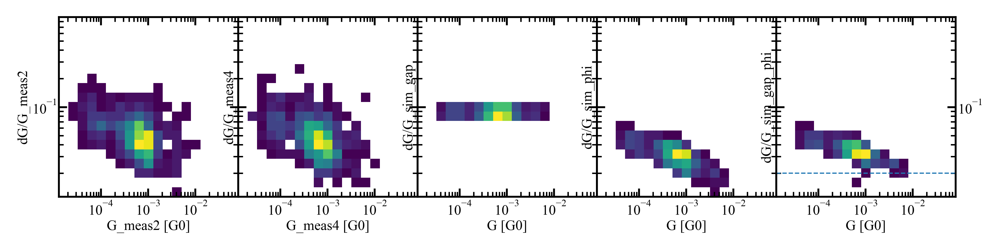

In [266]:
fig, ax = plot_2D_rel_noise_hists(sim_data,
                                  x_vars=('G_meas2 [G0]', 'G_meas4 [G0]', 'G [G0]', 'G [G0]', 'G [G0]'),
                                  y_vars=('dG/G_meas2', 'dG/G_meas4', 'dG/G_sim_gap', 'dG/G_sim_phi', 'dG/G_sim_gap_phi'),
                                  xrange=(1e-5, 1e-1), yrange=(1e-2, 1), xbins_num=20, ybins_num=20, cmap=my_cmap_blues, figsize=utils.cm2inch(16, 3.5))

ax[-1].axhline(2e-2, ls='--', lw=0.5)

In [255]:
example = sim_data[sim_data['dG/G_sim_gap_phi'] < 2e-2]['Trace']

In [257]:
example.shape

(100,)

In [239]:
which_trace = np.random.choice(example)
print(which_trace)

27081


In [258]:
sim_data[sim_data['dG/G_sim_gap_phi'] < 2e-2]

,Trace,Part,G [G0],R [Ohm],z -Gap [nm],Phi - Barrier [eV],dR/dz,dR/dPhi,G_meas2 [G0],dG/G_meas2,G_meas4 [G0],dG/G_meas4,Fit Trace,dG/G_sim_gap,dG/G_sim_phi,dG/G_sim_gap_phi
41,25675,1,0.000624,2.065847e+07,0.26,2.25,3.667745e+17,0.0,0.000609,0.221889,0.000687,0.053649,'1_IV_trace_25675_push_pl',0.106525,0.0,0.017754
218,26775,1,0.000624,2.065847e+07,0.26,2.25,3.667745e+17,0.0,0.000695,0.120718,0.000652,0.046610,'1_IV_trace_26775_push_pl',0.106525,0.0,0.017754
386,27986,1,0.000111,1.167140e+08,0.36,2.25,1.991916e+18,0.0,0.000112,0.060652,0.000091,0.116838,'1_IV_trace_27986_push_pl',0.102400,0.0,0.017067
497,28403,1,0.000524,2.464158e+07,0.27,2.25,4.356200e+17,0.0,0.000610,0.042898,0.000451,0.048655,'1_IV_trace_28403_push_pl',0.106069,0.0,0.017678
597,28794,1,0.000890,1.448654e+07,0.24,2.25,2.594642e+17,0.0,0.000987,0.036002,0.000859,0.037855,'1_IV_trace_28794_push_pl',0.107464,0.0,0.017911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4273,32281,4,0.000048,2.709736e+08,0.41,2.25,4.547496e+18,0.0,0.000047,0.070223,0.000066,0.099877,'4_IV_trace_32281_push_pl',0.100692,0.0,0.016782
4298,32479,4,0.000111,1.167140e+08,0.36,2.25,1.991916e+18,0.0,0.000100,0.046825,0.000103,0.034241,'4_IV_trace_32479_push_pl',0.102400,0.0,0.017067
4409,33754,4,0.003164,4.077709e+06,0.17,2.25,7.545127e+16,0.0,0.004404,0.035144,0.002770,0.041220,'4_IV_trace_33754_push_pl',0.111020,0.0,0.018503
4411,33759,4,0.003805,3.390655e+06,0.16,2.25,6.304246e+16,0.0,0.004620,0.021418,0.004320,0.020276,'4_IV_trace_33759_push_pl',0.111558,0.0,0.018593


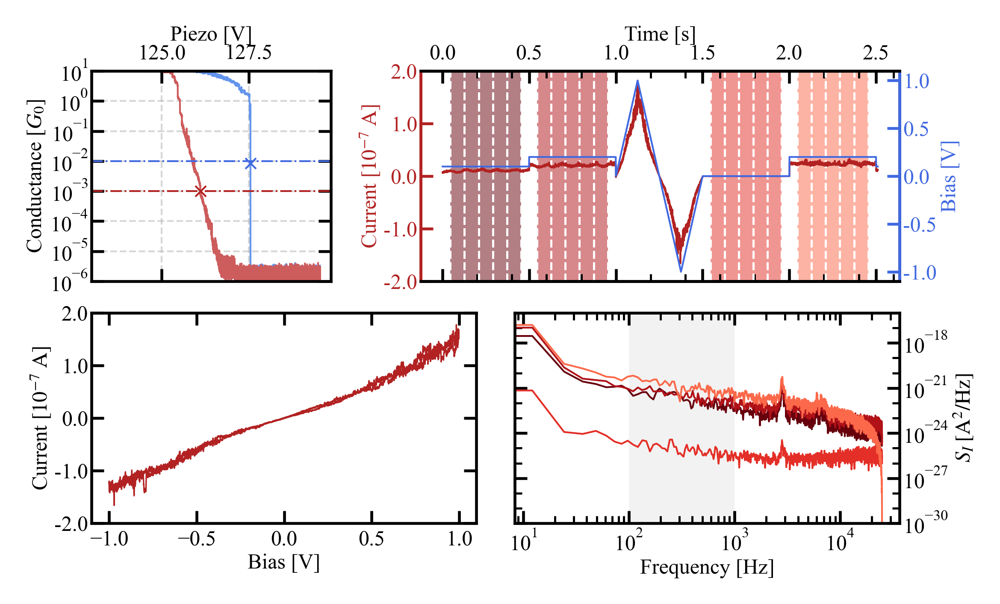

In [253]:
my_colors = colormaps['Reds'](np.linspace(0.5, 1, 4))[::-1]

hold_trace = HoldTrace(which_trace,
                           load_from=home_folder, bias_offset=0,
                           r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)
hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

fig, ax_trace, ax_hold, par_hold, ax_iv, ax_psd = \
plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push', color_list=my_colors, vline_color='white',
                          smoothing=10, which_psds=[0, 1, 2, 3], fig_size = utils.cm2inch(10, 5.6))

In [242]:
example2 = sim_data[sim_data['dG/G_sim_gap_phi'] > 2e-2]['Trace'].unique()

In [247]:
which_trace = np.random.choice(example2)
print(which_trace)

25745


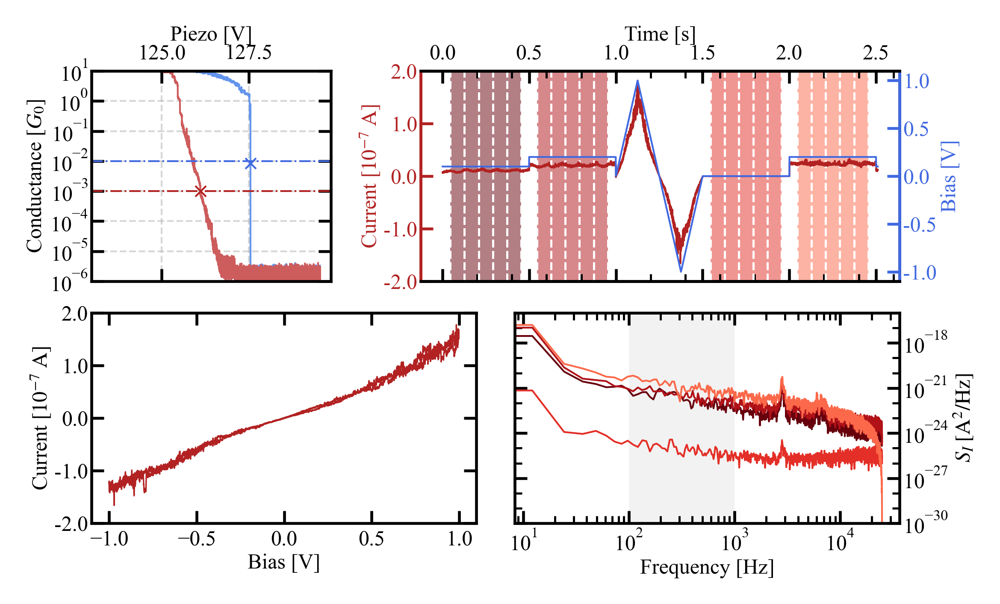

In [248]:
my_colors = colormaps['Reds'](np.linspace(0.5, 1, 4))[::-1]

hold_trace = HoldTrace(which_trace,
                           load_from=home_folder, bias_offset=0,
                           r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)
hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

fig, ax_trace, ax_hold, par_hold, ax_iv, ax_psd = \
plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push', color_list=my_colors, vline_color='white',
                          smoothing=10, which_psds=[0, 1, 2, 3], fig_size = utils.cm2inch(10, 5.6))

In [328]:
dz = 6e-3
dP = 50e-3
dzdP = (6e-3, 50e-3)

sim_data['dG/G_sim_gap'] = calc_noise_sim(sim_data, dgap=dz, dphi=0)
sim_data['dG/G_sim_phi'] = calc_noise_sim(sim_data, dgap=0, dphi=dP)
sim_data['dG/G_sim_gap_phi'] = calc_noise_sim(sim_data, dgap=dzdP[0], dphi=dzdP[1])

Calculating relative noise when the barrier fluctuation is dphi=0 eV and the gap fluctuation is dgap=0.006 nm.
Calculating relative noise when the barrier fluctuation is dphi=0.05 eV and the gap fluctuation is dgap=0 nm.
Calculating relative noise when the barrier fluctuation is dphi=0.05 eV and the gap fluctuation is dgap=0.006 nm.


Text(0.0007, 0.3, '$\\Delta z = 0.006\\;\\mathrm{nm}$, $\\Delta \\phi = 0.05\\;\\mathrm{eV}$')

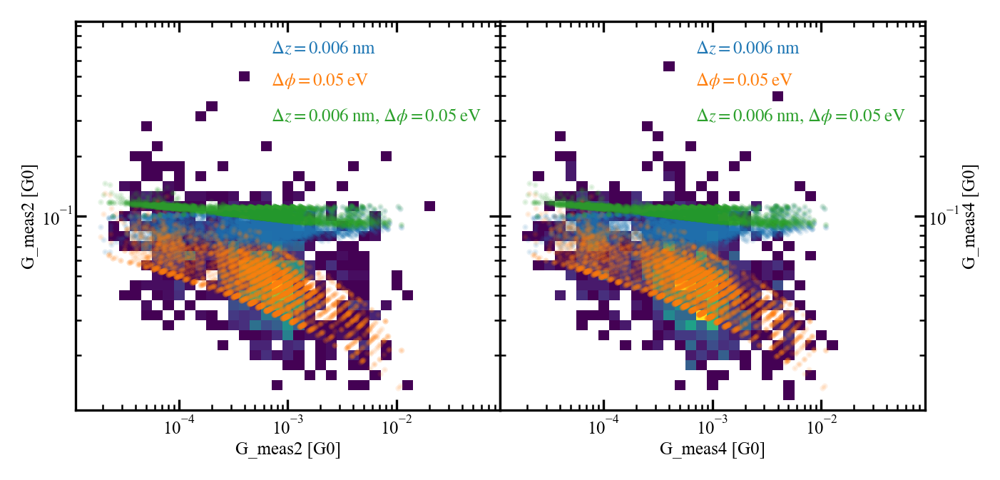

In [329]:
fig, ax = plot_2D_rel_noise_hist_and_scatter(df=sim_data,
                                             x_2d_vars=('G_meas2 [G0]', 'G_meas4 [G0]'), y_2d_vars=('dG/G_meas2', 'dG/G_meas4'),
                                             x_scat_vars=('G [G0]', 'G [G0]', 'G [G0]'), y_scat_vars=('dG/G_sim_gap', 'dG/G_sim_phi', 'dG/G_sim_gap_phi'),
                                             xrange=(1e-5, 1e-1), yrange=(1e-2, 1), xbins_num=40, ybins_num=40,
                                             cmap=my_cmap_blues, figsize=utils.cm2inch(12, 6), dpi=300, s=1, alpha=0.1)

ax[0].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax[1].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=False, labelbottom=True)
ax[1].yaxis.set_label_position('right')

ax[0].text(x=7e-4, y=6.5e-1, s=r'$\Delta z = ' + f'{dz}' + r'\;\mathrm{nm}$', c='tab:blue', fontsize=6)
ax[0].text(x=7e-4, y=4.5e-1, s=r'$\Delta \phi = ' + f'{dP}' + r'\;\mathrm{eV}$', c='tab:orange', fontsize=6)
ax[0].text(x=7e-4, y=3.0e-1, s=r'$\Delta z = ' + f'{dzdP[0]}' +r'\;\mathrm{nm}$,' + r' $\Delta \phi = ' + f'{dzdP[1]}' +r'\;\mathrm{eV}$', c='tab:green', fontsize=6)

ax[1].text(x=7e-4, y=6.5e-1, s=r'$\Delta z = ' + f'{dz}' + r'\;\mathrm{nm}$', c='tab:blue', fontsize=6)
ax[1].text(x=7e-4, y=4.5e-1, s=r'$\Delta \phi = ' + f'{dP}' + r'\;\mathrm{eV}$', c='tab:orange', fontsize=6)
ax[1].text(x=7e-4, y=3.0e-1, s=r'$\Delta z = ' + f'{dzdP[0]}' +r'\;\mathrm{nm}$,' + r' $\Delta \phi = ' + f'{dzdP[1]}' +r'\;\mathrm{eV}$', c='tab:green', fontsize=6)

In [268]:
sim_data_log = sim_data.copy()

In [269]:
sim_data_log.columns

Index(['Trace', 'Part', 'G [G0]', 'R [Ohm]', 'z -Gap [nm]',
       'Phi - Barrier [eV]', 'dR/dz', 'dR/dPhi', 'G_meas2 [G0]', 'dG/G_meas2',
       'G_meas4 [G0]', 'dG/G_meas4', 'Fit Trace', 'dG/G_sim_gap',
       'dG/G_sim_phi', 'dG/G_sim_gap_phi'],
      dtype='object')

In [270]:
warnings.filterwarnings("default")

In [272]:
sim_data_log['R [Ohm]'] = np.log10(sim_data_log['R [Ohm]'])
sim_data_log['G [G0]'] = np.log10(sim_data_log['G [G0]'])
sim_data_log['dR/dz'] = np.log10(sim_data_log['dR/dz'])
sim_data_log['dR/dPhi'] = np.log10(sim_data_log['dR/dPhi'])
sim_data_log['G_meas2 [G0]'] = np.log10(sim_data_log['G_meas2 [G0]'])
sim_data_log['dG/G_meas2'] = np.log10(sim_data_log['dG/G_meas2'])
sim_data_log['G_meas4 [G0]'] = np.log10(sim_data_log['G_meas4 [G0]'])
sim_data_log['dG/G_meas4'] = np.log10(sim_data_log['dG/G_meas4'])

sim_data_log['dG/G_sim_gap'] = np.log10(sim_data_log['dG/G_sim_gap'])
sim_data_log['dG/G_sim_phi'] = np.log10(sim_data_log['dG/G_sim_phi'])
sim_data_log['dG/G_sim_gap_phi'] = np.log10(sim_data_log['dG/G_sim_gap_phi'])

D:\mcbj_stmbj\venv\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


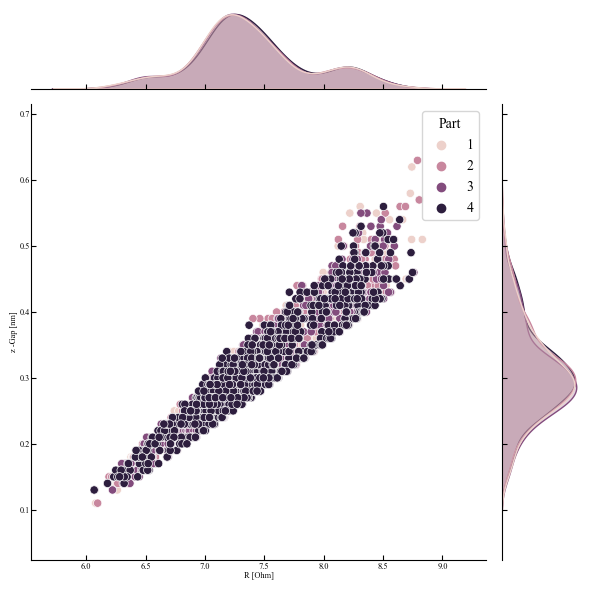

In [49]:
sns.jointplot(data=sim_data_log, x="R [Ohm]", y="z -Gap [nm]", hue="Part")

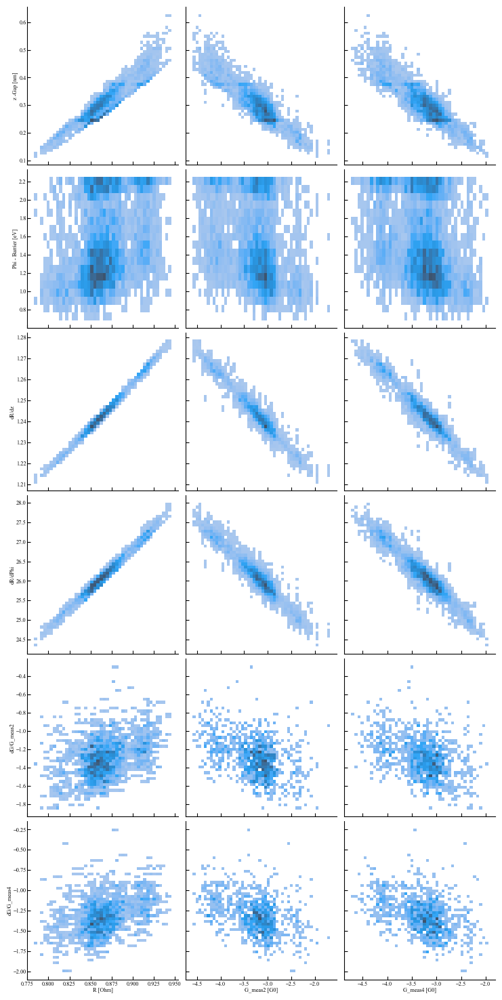

In [17]:
# sns.pairplot(data=sim_data_log[sim_data_log['Part'] == 3], x_vars=('R [Ohm]', 'G_meas2 [G0]', 'G_meas4 [G0]'), y_vars=('z -Gap [nm]', 'Phi - Barrier [eV]', 'dR/dz', 'dR/dPhi', 'dG/G_meas2', 'dG/G_meas4'), kind='hist')
sns.pairplot(data=sim_data_log, x_vars=('R [Ohm]', 'G_meas2 [G0]', 'G_meas4 [G0]'), y_vars=('z -Gap [nm]', 'Phi - Barrier [eV]', 'dR/dz', 'dR/dPhi', 'dG/G_meas2', 'dG/G_meas4'), kind='hist')

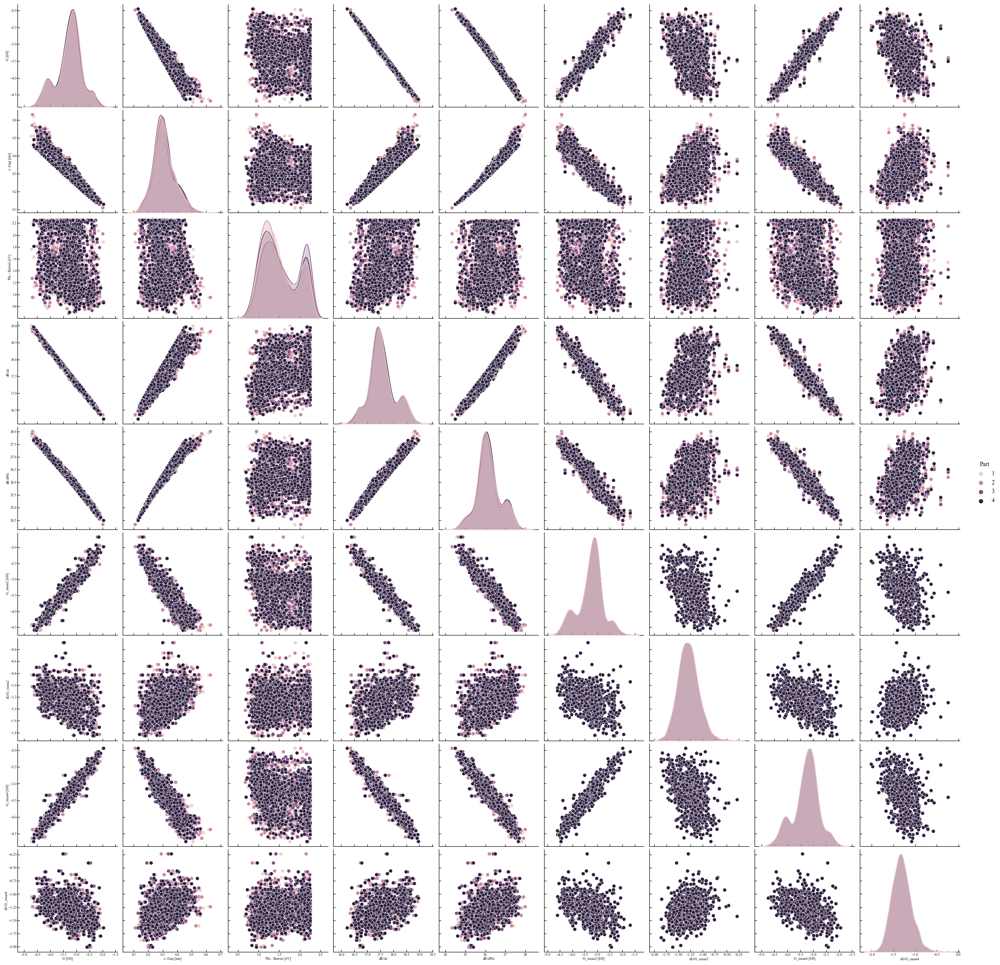

In [273]:
sns.color_palette("bright")
sns.pairplot(data=sim_data_log, vars=('G [G0]', 'z -Gap [nm]', 'Phi - Barrier [eV]', 'dR/dz', 'dR/dPhi', 'G_meas2 [G0]', 'dG/G_meas2', 'G_meas4 [G0]', 'dG/G_meas4'), hue='Part')

4


Text(0.5, 0, 'Phi - Barrier [eV]')

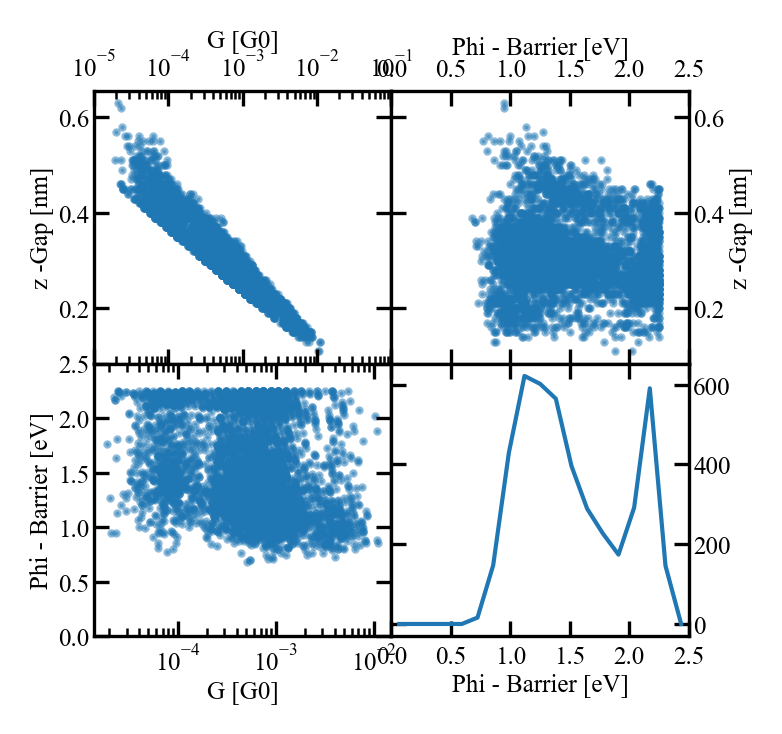

In [410]:
figsize = utils.cm2inch((6, 6))
dpi = 300

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 2, figure=fig,
                  left=0.08, right=0.92, top=0.9, bottom=0.13,
                  hspace=0.0, wspace=0.0)

ax = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(2)]

print(len(ax))

ax[0].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax[1].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax[2].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax[3].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=False, labelbottom=True)

ax[0].xaxis.set_label_position('top')
ax[1].xaxis.set_label_position('top')
ax[1].yaxis.set_label_position('right')
ax[3].yaxis.set_label_position('right')

ax[0].scatter(sim_data['G [G0]'], sim_data['z -Gap [nm]'], s=1, alpha=0.5)
ax[0].set_xlabel('G [G0]')
ax[0].set_xlim(1e-5, 1e-1)
ax[0].set_xscale('log')
ax[0].set_ylabel('z -Gap [nm]')

ax[0].xaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax[0].xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax[0].xaxis.set_minor_formatter(ticker.NullFormatter())

ax[2].scatter(sim_data['G [G0]'], sim_data['Phi - Barrier [eV]'], s=1, alpha=0.5)
ax[2].set_xlabel('G [G0]')
ax[0].set_xlim(1e-5, 1e-1)
ax[2].set_xscale('log')
ax[2].set_ylabel('Phi - Barrier [eV]')
ax[2].set_ylim(0, 2.5)

ax[2].xaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax[2].xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax[2].xaxis.set_minor_formatter(ticker.NullFormatter())

ax[1].scatter(sim_data['Phi - Barrier [eV]'], sim_data['z -Gap [nm]'], s=1, alpha=0.5)
ax[1].set_xlabel('Phi - Barrier [eV]')
ax[1].set_xlim(0, 2.5)
ax[1].set_xticks(np.arange(0, 2.51, 0.5))
ax[1].set_ylabel('z -Gap [nm]')
phi_bins, phi_hist1d = utils.calc_hist_1d_single(data=sim_data['Phi - Barrier [eV]'], xrange=(0, 2.5),
                                                 xbins_num=20, log_scale=False, bin_mode='total')

ax[3].plot(phi_bins, phi_hist1d, lw=1)
ax[3].set_xlim(0, 2.5)
ax[3].set_xticks(np.arange(0, 2.51, 0.5))
ax[3].set_xlabel('Phi - Barrier [eV]')

4


Text(0.5, 0, 'Phi - Barrier [eV]')

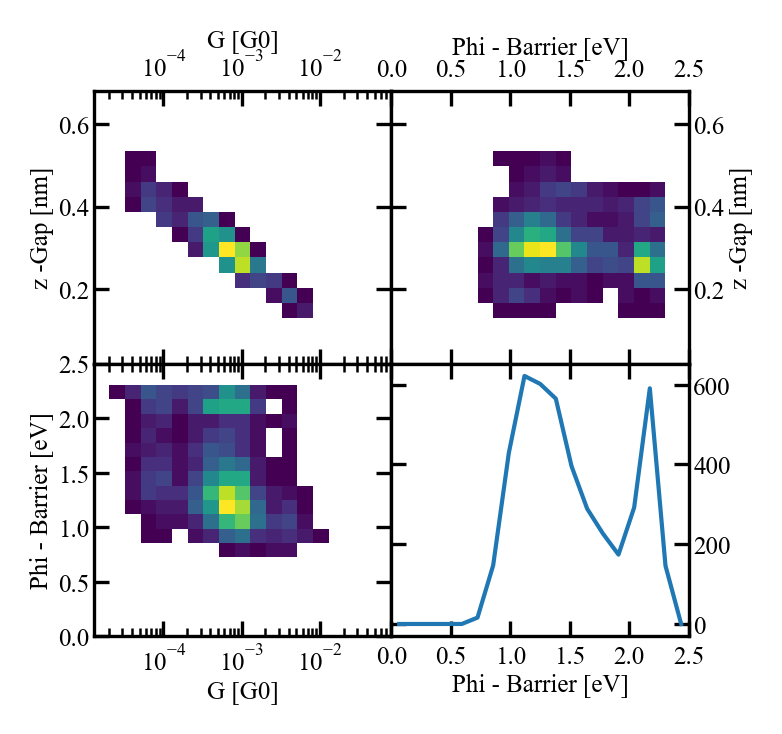

In [408]:
figsize = utils.cm2inch((6, 6))
dpi = 300

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 2, figure=fig,
                  left=0.08, right=0.92, top=0.9, bottom=0.13,
                  hspace=0.0, wspace=0.0)

ax = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(2)]

print(len(ax))

ax[0].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax[1].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax[2].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax[3].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=False, labelbottom=True)

ax[0].xaxis.set_label_position('top')
ax[1].xaxis.set_label_position('top')
ax[1].yaxis.set_label_position('right')
ax[3].yaxis.set_label_position('right')

# ax[0].scatter(sim_data['G [G0]'], sim_data['z -Gap [nm]'], s=1, alpha=0.5)

bins_G, _ = utils.calc_hist_1d_single(data=sim_data['G [G0]'], xrange=(1e-5, 1e-1),
                                      xbins_num=20, log_scale=True, bin_mode='total')
bins_z, _ = utils.calc_hist_1d_single(data=sim_data['z -Gap [nm]'], xrange=(0, 0.7),
                                      xbins_num=20, log_scale=False, bin_mode='total')
bins_Phi, hist_1d_Phi = utils.calc_hist_1d_single(data=sim_data['Phi - Barrier [eV]'], xrange=(0, 2.5),
                                                  xbins_num=20, log_scale=False, bin_mode='total')

h0, xedges, yedges = np.histogram2d(sim_data['G [G0]'], sim_data['z -Gap [nm]'],
                                    bins=[bins_G, bins_z])
x_mesh0, y_mesh0 = np.meshgrid(xedges, yedges)
im0 = ax[0].pcolormesh(x_mesh0, y_mesh0, h0.T, cmap=my_cmap, vmin=-1)

ax[0].set_xlabel('G [G0]')
ax[0].set_xscale('log')
ax[0].set_ylabel('z -Gap [nm]')

ax[0].xaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax[0].xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax[0].xaxis.set_minor_formatter(ticker.NullFormatter())

# ax[2].scatter(sim_data['G [G0]'], sim_data['Phi - Barrier [eV]'], s=1, alpha=0.5)

h2, xedges, yedges = np.histogram2d(sim_data['G [G0]'], sim_data['Phi - Barrier [eV]'],
                                    bins=[bins_G, bins_Phi])
x_mesh2, y_mesh2 = np.meshgrid(xedges, yedges)
im2 = ax[2].pcolormesh(x_mesh2, y_mesh2, h2.T, cmap=my_cmap, vmin=-1)

ax[2].set_xlabel('G [G0]')
ax[2].set_xscale('log')
ax[2].set_ylabel('Phi - Barrier [eV]')
ax[2].set_ylim(0, 2.5)

ax[2].xaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax[2].xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax[2].xaxis.set_minor_formatter(ticker.NullFormatter())

# ax[1].scatter(sim_data['Phi - Barrier [eV]'], sim_data['z -Gap [nm]'], s=1, alpha=0.5)

h1, xedges, yedges = np.histogram2d(sim_data['Phi - Barrier [eV]'], sim_data['z -Gap [nm]'],
                                    bins=[bins_Phi, bins_z])
x_mesh1, y_mesh1 = np.meshgrid(xedges, yedges)
im1 = ax[1].pcolormesh(x_mesh1, y_mesh1, h1.T, cmap=my_cmap, vmin=-1)

ax[1].set_xlabel('Phi - Barrier [eV]')
ax[1].set_xlim(0, 2.5)
ax[1].set_xticks(np.arange(0, 2.51, 0.5))
ax[1].set_ylabel('z -Gap [nm]')

ax[3].plot(bins_Phi, hist_1d_Phi, lw=1)
ax[3].set_xlim(0, 2.5)
ax[3].set_xticks(np.arange(0, 2.51, 0.5))
ax[3].set_xlabel('Phi - Barrier [eV]')

In [365]:
hold_df_pull_log = hold_df_pull.copy()
hold_df_push_log = hold_df_push.copy()

cols_pull = ['pull_set_trigger', 'pull_last_before_hold', 'pull_first_after_hold', 'pull_start_avg', 'pull_end_avg']
cols_push = ['push_set_trigger', 'push_last_before_hold', 'push_first_after_hold', 'push_start_avg', 'push_end_avg']

hold_df_pull_log[cols_pull] = hold_df_pull_log[cols_pull].transform(lambda x: np.log10(x))
hold_df_push_log[cols_push] = hold_df_push_log[cols_push].transform(lambda x: np.log10(x))

In [366]:
import seaborn as sns

In [367]:
def plot_unity(xdata, ydata, **kwargs):
    mn = min(xdata.min(), ydata.min())
    mx = max(xdata.max(), ydata.max())
    points = np.linspace(mn, mx, 100)
    plt.gca().plot(points, points, color='k', marker=None,
            linestyle='-', linewidth=1.0)

4


Text(0, 0.5, 'Counts [a.u.]')

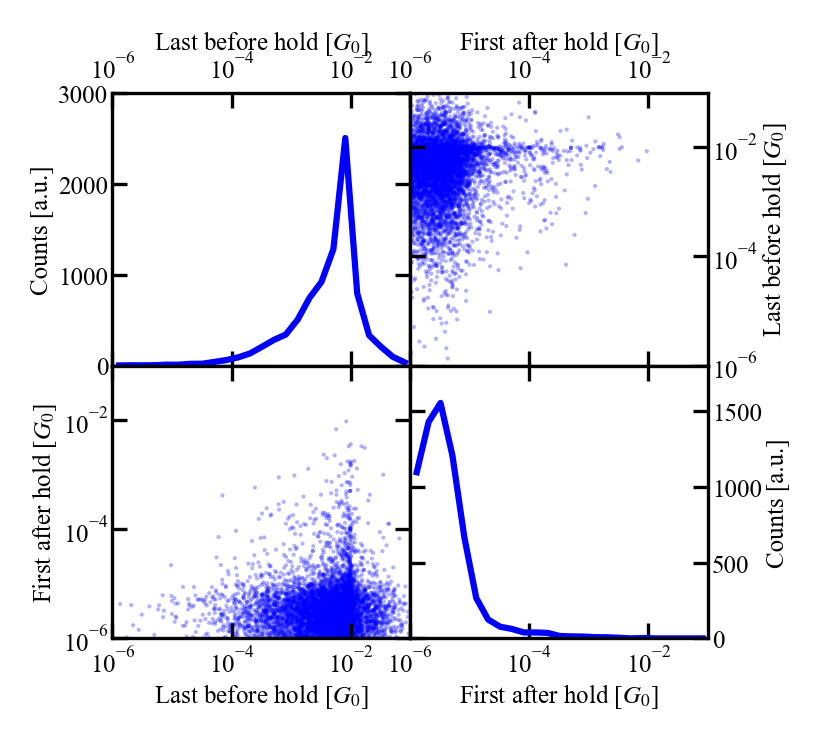

In [424]:
figsize = utils.cm2inch((6, 6))
dpi = 300

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 2, figure=fig,
                  left=0.08, right=0.92, top=0.9, bottom=0.13,
                  hspace=0.0, wspace=0.0)

ax = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(2)]

print(len(ax))

ax[0].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax[1].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax[2].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax[3].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=False, labelbottom=True)

ax[0].xaxis.set_label_position('top')
ax[1].xaxis.set_label_position('top')
ax[1].yaxis.set_label_position('right')
ax[3].yaxis.set_label_position('right')

ax[0].set_xscale('log')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[3].set_xscale('log')

ax[0].set_xlim(1e-6, 1e-1)
ax[0].set_ylim(0, 3000)
ax[1].set_xlim(1e-6, 1e-1)
ax[1].set_ylim(1e-6, 1e-1)
ax[2].set_xlim(1e-6, 1e-1)
ax[2].set_ylim(1e-6, 1e-1)
ax[3].set_xlim(1e-6, 1e-1)
ax[3].set_ylim(0, 1800)

bins_1, hist_1d_1 = utils.calc_hist_1d_single(data=hold_df_pull['pull_last_before_hold'], xrange=(1e-6, 1e-1),
                                              xbins_num=5, log_scale=True, bin_mode='decade')

bins_2, hist_1d_2 = utils.calc_hist_1d_single(data=hold_df_pull['pull_first_after_hold'], xrange=(1e-6, 1e-1),
                                              xbins_num=5, log_scale=True, bin_mode='decade')

ax[0].plot(bins_1, hist_1d_1, c='b')
ax[3].plot(bins_2, hist_1d_2, c='b')
ax[1].scatter(hold_df_pull['pull_first_after_hold'], hold_df_pull['pull_last_before_hold'], s=1, alpha=0.3, edgecolor='None', color='b')
ax[2].scatter(hold_df_pull['pull_last_before_hold'], hold_df_pull['pull_first_after_hold'], s=1, alpha=0.3, edgecolor='None', color='b')

ax[0].set_xlabel(r'Last before hold [$G_{0}$]')
ax[0].set_ylabel('Counts [a.u.]')

ax[1].set_ylabel(r'Last before hold [$G_{0}$]')
ax[1].set_xlabel(r'First after hold [$G_{0}$]')
ax[2].set_ylabel(r'First after hold [$G_{0}$]')
ax[2].set_xlabel(r'Last before hold [$G_{0}$]')

ax[3].set_xlabel(r'First after hold [$G_{0}$]')
ax[3].set_ylabel('Counts [a.u.]')

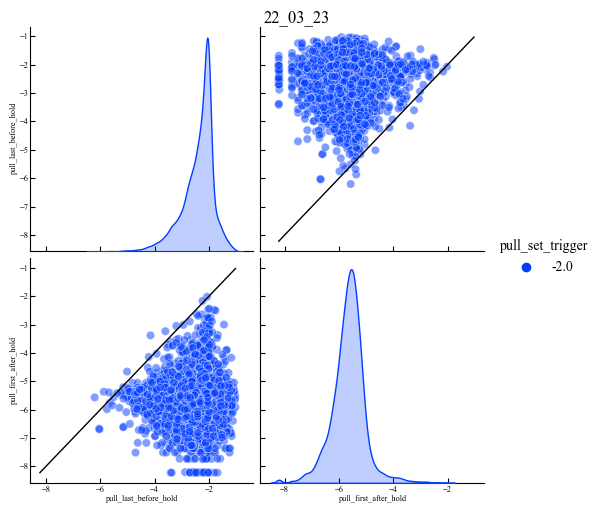

In [411]:
g = sns.pairplot(data=hold_df_pull_log, vars=['pull_last_before_hold', 'pull_first_after_hold'],
                 hue='pull_set_trigger', kind='scatter', plot_kws={'alpha': 0.5}, palette='bright')
g.fig.suptitle(f'{date}', y=1.01)
g.map_offdiag(plot_unity)

4


Text(0, 0.5, 'Counts [a.u.]')

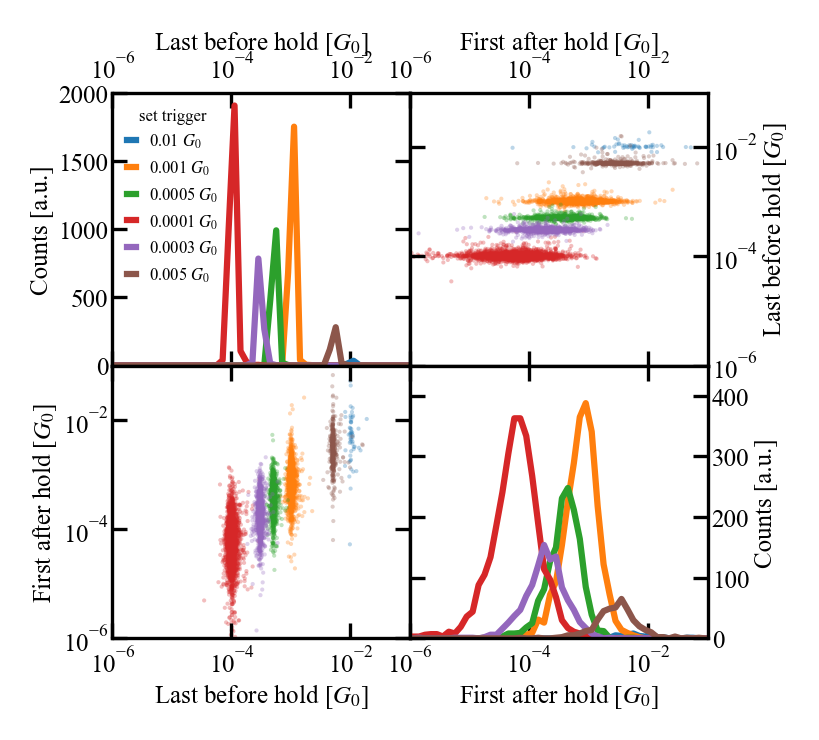

In [440]:
figsize = utils.cm2inch((6, 6))
dpi = 300

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 2, figure=fig,
                  left=0.08, right=0.92, top=0.9, bottom=0.13,
                  hspace=0.0, wspace=0.0)

ax = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(2)]

print(len(ax))

ax[0].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax[1].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax[2].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax[3].tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=False, labelright=True, labeltop=False, labelbottom=True)

ax[0].xaxis.set_label_position('top')
ax[1].xaxis.set_label_position('top')
ax[1].yaxis.set_label_position('right')
ax[3].yaxis.set_label_position('right')

ax[0].set_xscale('log')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[3].set_xscale('log')

ax[0].set_xlim(1e-6, 1e-1)
ax[0].set_ylim(0, 2000)
ax[1].set_xlim(1e-6, 1e-1)
ax[1].set_ylim(1e-6, 1e-1)
ax[2].set_xlim(1e-6, 1e-1)
ax[2].set_ylim(1e-6, 1e-1)
ax[3].set_xlim(1e-6, 1e-1)
ax[3].set_ylim(0, 450)

for i, trig in enumerate(hold_df_push['push_set_trigger'].unique()):
    
    bins_1, hist_1d_1 = utils.calc_hist_1d_single(data=hold_df_push[hold_df_push['push_set_trigger'] == trig]['push_last_before_hold'], xrange=(1e-6, 1e-1),
                                                  xbins_num=10, log_scale=True, bin_mode='decade')

    bins_2, hist_1d_2 = utils.calc_hist_1d_single(data=hold_df_push[hold_df_push['push_set_trigger'] == trig]['push_first_after_hold'], xrange=(1e-6, 1e-1),
                                                  xbins_num=10, log_scale=True, bin_mode='decade')

    ax[0].plot(bins_1, hist_1d_1, label=str(trig) + r' $G_{0}$')
    ax[3].plot(bins_2, hist_1d_2, label=str(trig) + r' $G_{0}$')
    ax[1].scatter(hold_df_push[hold_df_push['push_set_trigger'] == trig]['push_first_after_hold'], hold_df_push[hold_df_push['push_set_trigger'] == trig]['push_last_before_hold'],
                  s=1, alpha=0.3, edgecolor='None', label=str(trig) + r' $G_{0}$')
    ax[2].scatter(hold_df_push[hold_df_push['push_set_trigger'] == trig]['push_last_before_hold'], hold_df_push[hold_df_push['push_set_trigger'] == trig]['push_first_after_hold'],
                  s=1, alpha=0.3, edgecolor='None', label=str(trig) + r' $G_{0}$')

ax[0].set_xlabel(r'Last before hold [$G_{0}$]')
ax[0].set_ylabel('Counts [a.u.]')

ax[1].set_ylabel(r'Last before hold [$G_{0}$]')
ax[1].set_xlabel(r'First after hold [$G_{0}$]')
ax[2].set_ylabel(r'First after hold [$G_{0}$]')
ax[2].set_xlabel(r'Last before hold [$G_{0}$]')

ax[0].legend(fontsize=4, handlelength=0.5, frameon=False, title='set trigger', title_fontproperties={'size': 4})

ax[3].set_xlabel(r'First after hold [$G_{0}$]')
ax[3].set_ylabel('Counts [a.u.]')

In [427]:
hold_df_push['push_set_trigger'].unique()

array([0.01  , 0.001 , 0.0005, 0.0001, 0.0003, 0.005 ])

In [430]:
hold_df_push[hold_df_push['push_set_trigger'] == 0.01]['push_first_after_hold']

(54,)

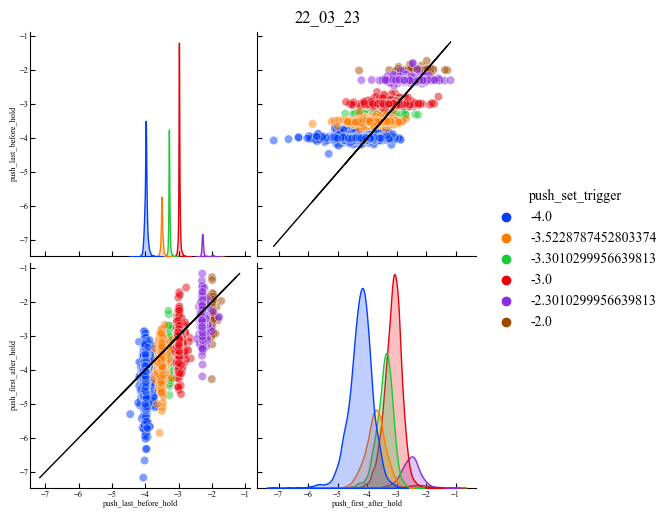

In [371]:
g = sns.pairplot(data=hold_df_push_log, vars=['push_last_before_hold', 'push_first_after_hold'],
                 hue='push_set_trigger', kind='scatter', plot_kws={'alpha': 0.5}, palette='bright')
g.fig.suptitle(f'{date}', y=1.02)
g.map_offdiag(plot_unity)

In [82]:
test = hold_df[np.bitwise_and(hold_df['push_stable'],
                              np.bitwise_and(hold_df['iv_diff_push'] > 0.5,
                                             hold_df['iv_diff_push'] < 0.55))].index.to_numpy()

In [83]:
hold_df[hold_df.index.isin(test)].sort_values(by='iv_diff_push', ascending=False)

,pull_set_trigger,pull_last_before_hold,pull_first_after_hold,pull_start_avg,pull_end_avg,iv_diff_pull,push_set_trigger,push_last_before_hold,push_first_after_hold,push_start_avg,push_end_avg,iv_diff_push,pull_did_not_break,push_did_not_break,pull_stable,push_stable
30644,0.01,0.009796,6.024921e-09,0.009979,0.000003,0.954089,0.0001,0.000114,0.000052,0.000083,0.000054,0.549989,False,True,False,True
29175,0.01,0.004349,4.892039e-05,0.002606,0.000044,0.686043,0.0010,0.001050,0.000864,0.000909,0.000960,0.549759,True,True,True,True
28040,0.01,0.001078,1.728157e-06,0.000022,0.000004,0.660877,0.0005,0.000571,0.000474,0.000450,0.000448,0.549730,False,True,False,True
33381,0.01,0.008549,9.933767e-06,0.008182,0.000010,0.769162,0.0003,0.000291,0.000300,0.000244,0.000366,0.549704,False,True,False,True
33972,0.01,0.007174,2.380370e-06,0.002637,0.000004,1.291706,0.0050,0.005287,0.000785,0.005222,0.000819,0.549684,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26428,0.01,0.006191,3.056690e-06,0.000061,0.000002,0.513965,0.0010,0.001092,0.001841,0.000805,0.001747,0.500431,False,True,False,True
28176,0.01,0.001097,7.768534e-06,0.000028,0.000009,0.593583,0.0005,0.000531,0.000510,0.000381,0.000513,0.500334,False,True,False,True
29085,0.01,0.004933,5.627976e-06,0.007265,0.000004,1.180635,0.0010,0.001123,0.000498,0.000756,0.000599,0.500193,False,True,False,True
32370,0.01,0.006308,7.104215e-06,0.000009,0.000003,0.843884,0.0001,0.000110,0.000096,0.000056,0.000108,0.500095,False,True,False,True


In [140]:
# 25204-25206-25210

which_trace = 25204

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
                         smoothing=10, which_psds=[0, 1, 2, 3])

print(hold_trace.avg_cond_on_step_pull)
print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

MeasurementOverflow: Current overflow during I(V) cycle, in push direction.

In [150]:
# iv_folder = Path("D:/BJ_Data/22_03_23/results/IVs/selected/selected_iv_diff_070")
# print(home_folder)
# print(iv_folder)

# check_files = [i for i in iv_folder.iterdir()]

# for x in tqdm(check_files):
#     # print(utils.get_num_from_name(x.name))    
#     try:
#         hold_trace = HoldTrace(utils.get_num_from_name(x.name),
#                            load_from=home_folder, bias_offset=0,
#                            r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)
#     except MeasurementOverflow:
#         print(f'deleting file {x}')
#         os.remove(x)

## 25201-34200    rate=3

In [3]:
total_num = 34200-25200
print(total_num)

9000


### Filtering traces that did not break during the hold measurement

In [4]:
did_not_break_pull, did_not_break_push = filter_traces.filter_hold(home_folder,
                                                                   filter_condition=filter_traces.does_not_break_array,
                                                                   start_trace=25201, end_trace=34200,
                                                                   bias_offset=0, r_serial_ohm=99900,
                                                                   min_step_len=20_000)

with open(home_folder.joinpath('results/did_not_break_pull.npy'), 'wb') as f:
    np.save(f, did_not_break_pull)
    
with open(home_folder.joinpath('results/did_not_break_push.npy'), 'wb') as f:
    np.save(f, did_not_break_push)

  0%|          | 0/9000 [00:00<?, ?it/s]

In [5]:
with open(home_folder.joinpath('results/did_not_break_pull.npy'), 'rb') as f:
    did_not_break_pull = np.load(f)
    
with open(home_folder.joinpath('results/did_not_break_push.npy'), 'rb') as f:
    did_not_break_push = np.load(f)

In [6]:
print(f'pull: {len(did_not_break_pull)}, {len(did_not_break_pull)/total_num*100}%')
print(f'push: {len(did_not_break_push)}, {len(did_not_break_push)/total_num*100}%')

pull: 388, 4.311111111111112%
push: 8574, 95.26666666666667%


0.6943193472802837


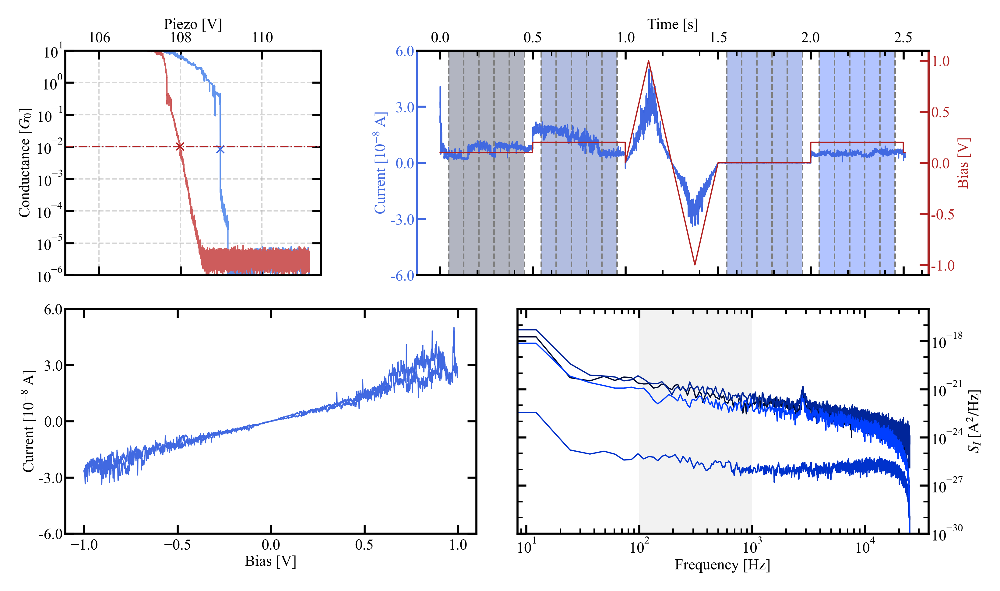

In [15]:
which_trace = did_not_break_pull[6]

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull',
                         smoothing=10, which_psds=[0, 1, 2, 3])

print(filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100))

0.596353492240754


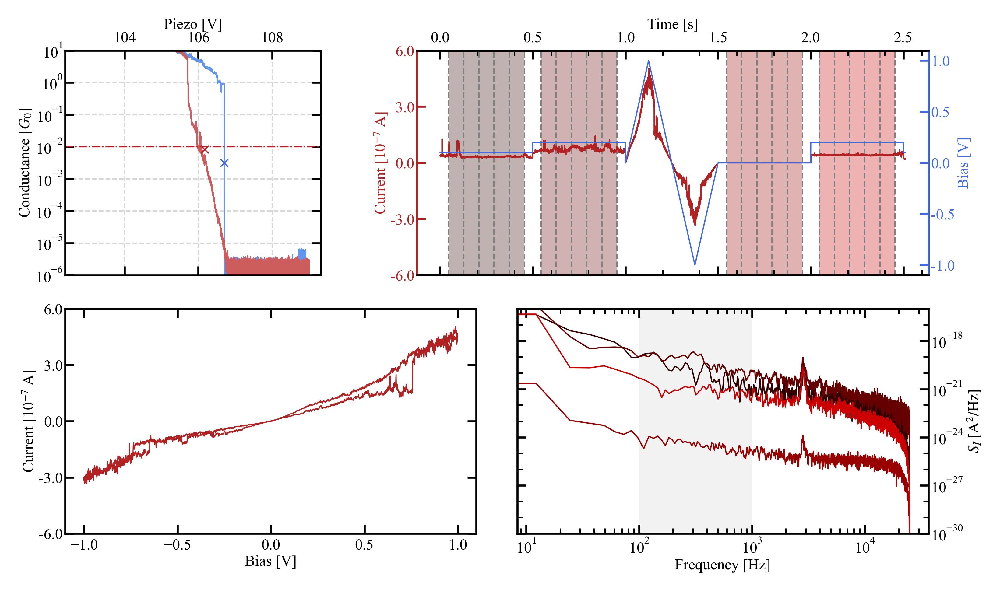

In [18]:
which_trace = did_not_break_push[0]

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
                         smoothing=10, which_psds=[0, 1, 2, 3])

print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

In [19]:
hold_trace.bias_steps

array([ 0.0990061,  0.1990122, -0.001    ,  0.1990122], dtype=float32)

### Filtering traces where the conductance on the two 200 mV bias plateaus do not differ more than a factor of 2

In [20]:
stable_pull, _ = filter_traces.filter_hold(home_folder, filter_condition=filter_traces.conductances_close,
                                           traces=did_not_break_pull,
                                           bias_offset=0, r_serial_ohm=r_serial,
                                           min_step_len=20_000, max_ratio=2, plateaus=(1, 3))

_, stable_push = filter_traces.filter_hold(home_folder, filter_condition=filter_traces.conductances_close,
                                           traces=did_not_break_push,
                                           bias_offset=0, r_serial_ohm=r_serial,
                                           min_step_len=20_000, max_ratio=2, plateaus=(1, 3))

with open(home_folder.joinpath('results/stable_pull.npy'), 'wb') as f:
    np.save(f, stable_pull)
    
with open(home_folder.joinpath('results/stable_push.npy'), 'wb') as f:
    np.save(f, stable_push)

  0%|          | 0/388 [00:00<?, ?it/s]

  0%|          | 0/8574 [00:00<?, ?it/s]

In [21]:
with open(home_folder.joinpath('results/stable_pull.npy'), 'rb') as f:
    stable_pull = np.load(f)
    
with open(home_folder.joinpath('results/stable_push.npy'), 'rb') as f:
    stable_push = np.load(f)

In [22]:
print(f'pull: {len(stable_pull)}, {len(stable_pull)/total_num*100}%')
print(f'push: {len(stable_push)}, {len(stable_push)/total_num*100}%')

pull: 291, 3.2333333333333334%
push: 8361, 92.9%


We are interested in the I(V) curves where the up-down sweeps overlap nicely. The difference between the up-down sweeps is calculated with the function `filter_traces.iv_difference`

### Filtering traces where the up-down I(V) sweeps overlap

0.6126826799895523


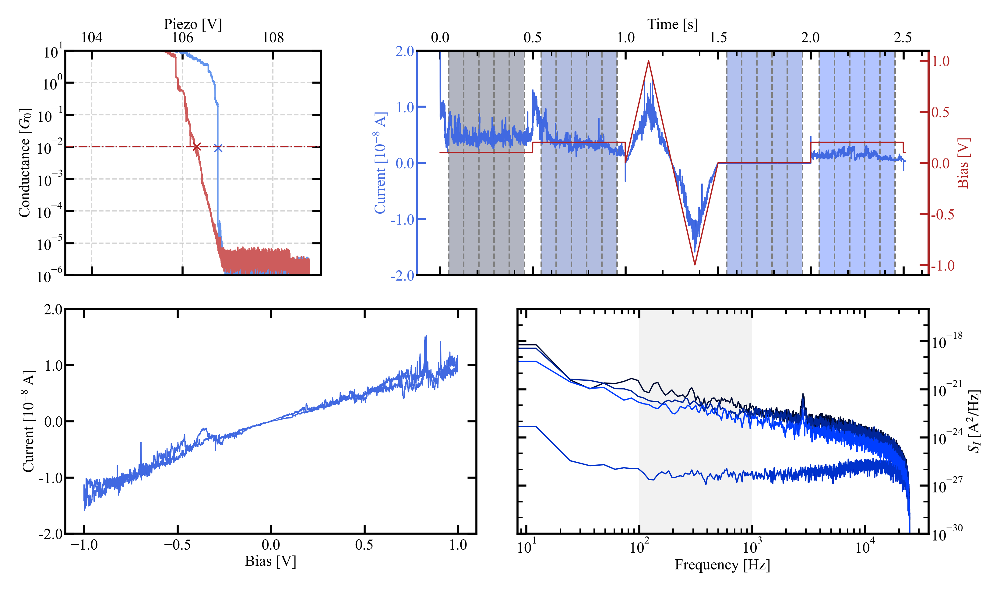

In [29]:
which_trace = stable_pull[1]

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull',
                         smoothing=10, which_psds=[0, 1, 2, 3])

print(filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100))

0.596353492240754


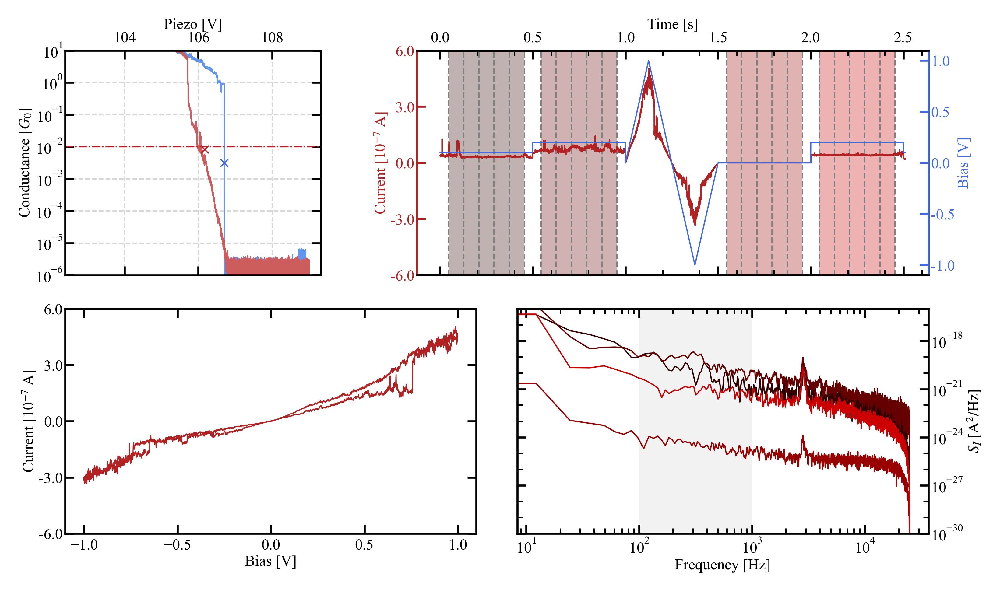

In [28]:
which_trace = stable_push[0]

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
                         smoothing=10, which_psds=[0, 1, 2, 3])

print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))

In [32]:
def get_iv_diff(trace: int, direction: str):
    try:
        hold_trace = HoldTrace(trace, load_from=home_folder, bias_offset=0,
                               r_serial_ohm=99900, min_step_len=20_000, min_height=1, iv=1)
        # push_diff.append(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))
        # traces.append(hold_trace.trace_num)
        return filter_traces.iv_difference(hold_trace, direction=direction, smoothing=100)
    except MeasurementOverflow:
        return -1

In [33]:
push_diff = np.array(list(map(get_iv_diff, stable_push, ['push']*len(stable_push))))

In [34]:
pull_diff = np.array(list(map(get_iv_diff, stable_pull, ['pull']*len(stable_pull))))

1458 17.43810548977395


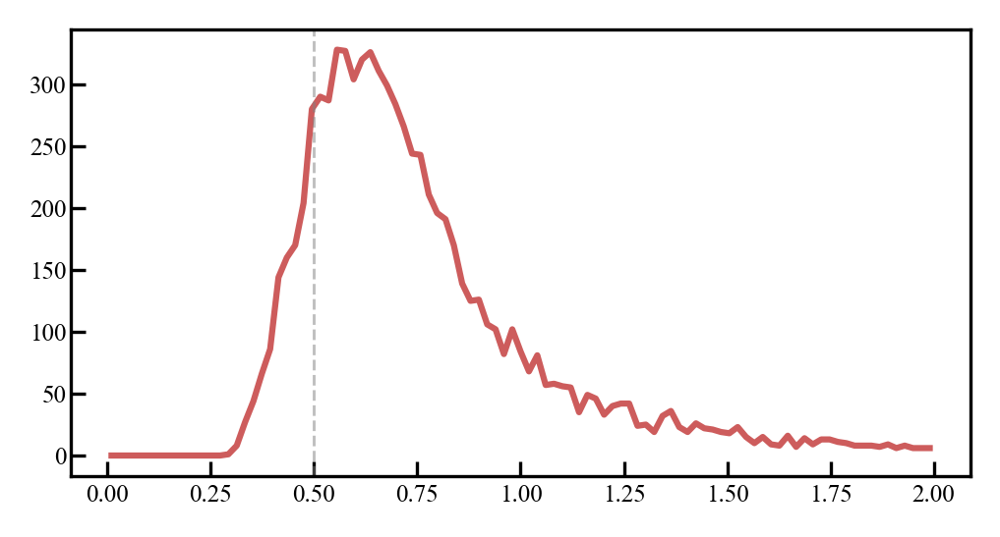

In [35]:
push_diff_bins, push_diff_hist = utils.calc_hist_1d_single(data=push_diff, xrange=(0, 2),
                                                           xbins_num=100, log_scale=False)

print(len(push_diff[push_diff < 0.5]), len(push_diff[push_diff < 0.5])/len(push_diff)*100)

fig, ax = plt.subplots(1, figsize=utils.cm2inch(10, 5), dpi=300)
ax.plot(push_diff_bins, push_diff_hist, 'indianred')
ax.axvline(0.5, c='grey', alpha=0.5, ls='--', lw=0.7)

66 22.68041237113402


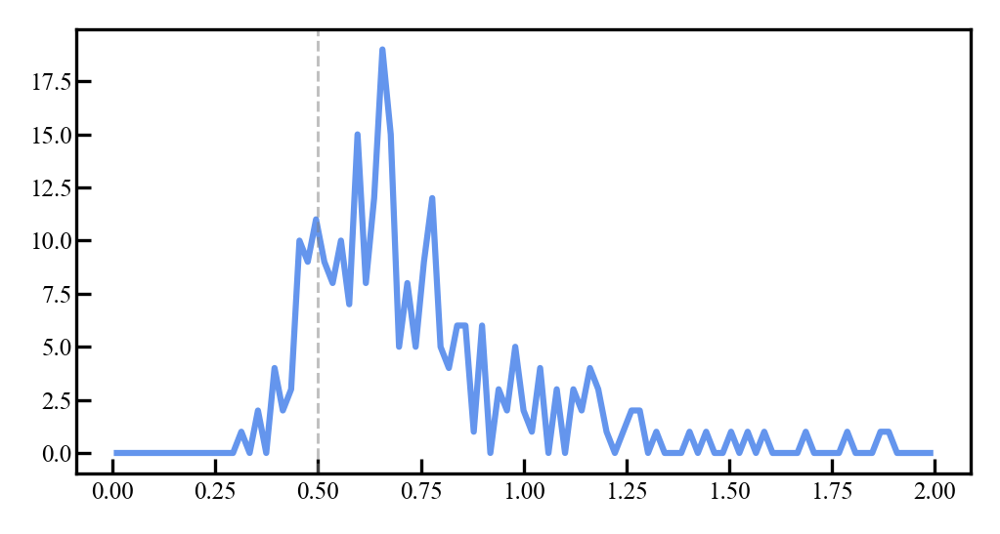

In [36]:
pull_diff_bins, pull_diff_hist = utils.calc_hist_1d_single(data=pull_diff, xrange=(0, 2),
                                                           xbins_num=100, log_scale=False)

print(len(pull_diff[pull_diff < 0.5]), len(pull_diff[pull_diff < 0.5])/len(pull_diff)*100)

fig, ax = plt.subplots(1, figsize=utils.cm2inch(10, 5), dpi=300)
ax.plot(pull_diff_bins, pull_diff_hist, 'cornflowerblue')
ax.axvline(0.5, c='grey', alpha=0.5, ls='--', lw=0.7)

In [37]:
iv_good_push = stable_push[np.where(np.logical_and(push_diff > 0, push_diff < 0.5))[0]]
iv_good_pull = stable_pull[np.where(np.logical_and(pull_diff > 0, pull_diff < 0.5))[0]]

with open(home_folder.joinpath('results/iv_good_pull.npy'), 'wb') as f:
    np.save(f, iv_good_pull)
    
with open(home_folder.joinpath('results/iv_good_push.npy'), 'wb') as f:
    np.save(f, iv_good_push)

In [38]:
with open(home_folder.joinpath('results/iv_good_pull.npy'), 'rb') as f:
    iv_good_pull = np.load(f)
    
with open(home_folder.joinpath('results/iv_good_push.npy'), 'rb') as f:
    iv_good_push = np.load(f)

In [39]:
print(f'pull: {len(iv_good_pull)}, {len(iv_good_pull)/total_num*100}%')
print(f'push: {len(iv_good_push)}, {len(iv_good_push)/total_num*100}%')

pull: 40, 0.4444444444444444%
push: 1124, 12.488888888888889%


In [40]:
iv_good_pull

array([28257, 28261, 28268, 28274, 28275, 28276, 28277, 28282, 28286,
       28505, 28514, 28516, 28517, 29196, 29210, 29211, 29212, 29214,
       29219, 29391, 29454, 29469, 29494, 29527, 29874, 31284, 32159,
       32175, 32224, 32315, 32378, 32450, 32528, 33125, 33128, 33251,
       33362, 33479, 33558, 34150])

0.4438313160717573


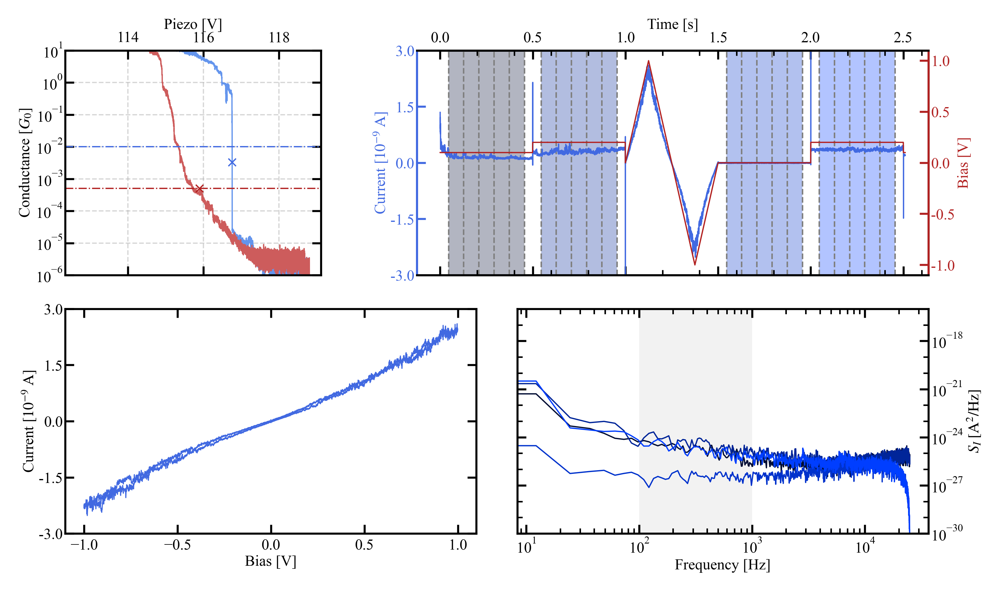

In [43]:
which_trace = iv_good_pull[0]

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=False)

ax_trace, ax_hold, par_hold, ax_iv, ax_psd = plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='pull',
                                                                       smoothing=10, which_psds=[0, 1, 2, 3])

# ax_iv.set_ylim(-1e-7, 1e-7, 1)
print(filter_traces.iv_difference(hold_trace, direction='pull', smoothing=100))

0.401014615393047


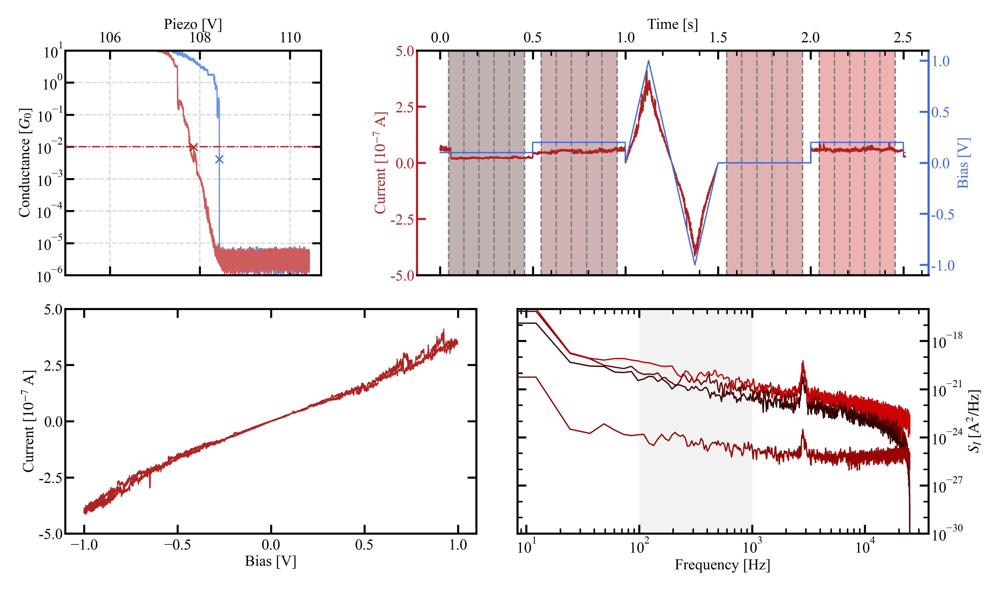

In [44]:
which_trace = iv_good_push[0]

hold_trace = HoldTrace(which_trace,
                       load_from=home_folder, bias_offset=0,
                       r_serial_ohm=r_serial, min_step_len=20_000, min_height=1, iv=1)

trace_pair = TracePair(which_trace, load_from=home_folder)

hold_trace.analyse_hold_trace(num_of_fft=5, subtract_bg=True)

plots.plot_ivs_scheme_one(trace_pair=trace_pair, hold_trace=hold_trace, direction='push',
                          smoothing=10, which_psds=[0, 1, 2, 3])

print(filter_traces.iv_difference(hold_trace, direction='push', smoothing=100))